# snRNA-seq QC and phenotypes

## Functions & Colors

In [1]:
source('jupyterFunctions.R')

In [2]:
input_dir <- '../../../input/20241219/'
file.exists(input_dir)

[1] TRUE

In [3]:
colors_vec <- readRDS('../addData/colors_vec.rds')

In [4]:
iLISI_low_color <- '#ffdf6a'
iLISI_high_color <- '#9d7b00'
cLISI_low_color <- '#028989'
cLISI_high_color <- '#5afdfd'

In [62]:
save_dir <- NA #'../output3/' #or NA if don't want to save
file_extension <- '.pdf'

## Dataset 1

In [6]:
data_dir <- paste(sep='',input_dir,'dataset1/')
dataset_str <- 'dataset1'
dataset_str_long <- 'Dataset 1'
phenotype_str <- 'RA Cell Type'
ori_phenotype_str <- 'RA Cell Type - Original Annotation'
sample_str <- '(n=12 samples)'

meta <- readRDS(paste(sep='',data_dir,dataset_str,'_meta.rds'))
gxc_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm.rds'))
gxCT_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm_phenotype_meanAggr.rds'))

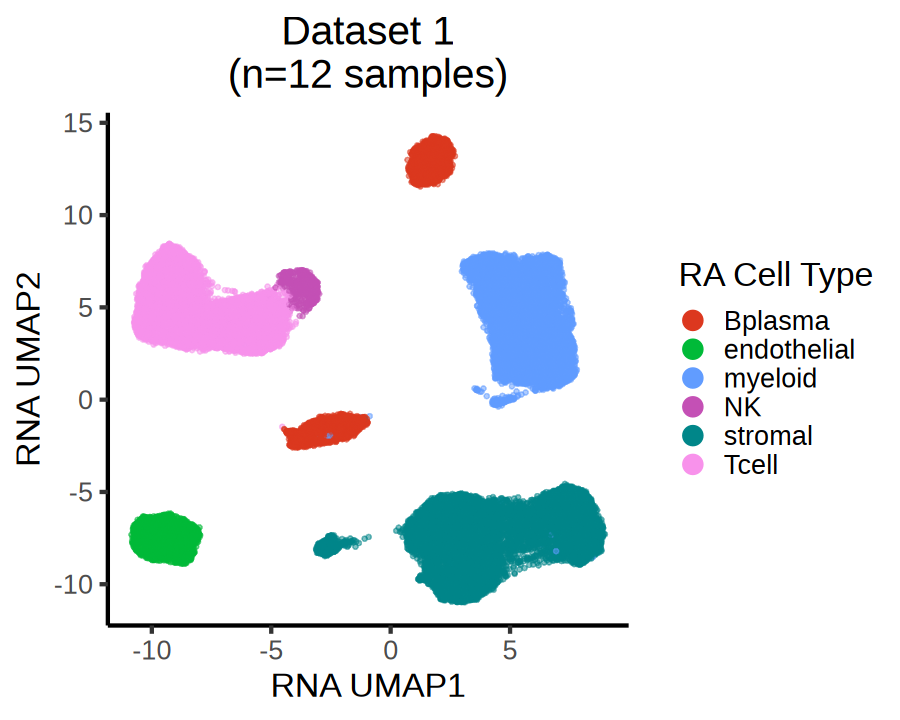

In [7]:
options(repr.plot.height=6,repr.plot.width=7.5)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=phenotype_str,x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_phenotype',file_extension),
           plot=g,units='in',height=6,width=7.5,dpi=300)
}

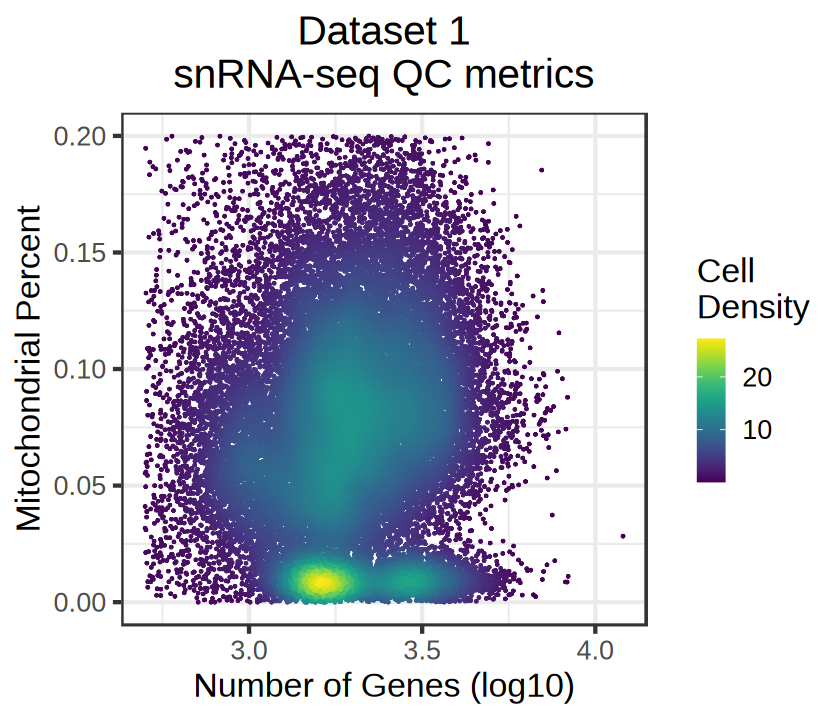

In [8]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nGene'=log10(meta$nGene),'MTperc'=meta$MTperc)
toPlot$density <- get_2D_density(toPlot$log10_nGene,toPlot$MTperc,n=1000)

g <- ggplot(toPlot,aes(x=log10_nGene,y=MTperc,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) +
            labs(x='Number of Genes (log10)',y='Mitochondrial Percent',color='Cell\nDensity',
                 title=paste(sep='\n',dataset_str_long,'snRNA-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_RNA_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

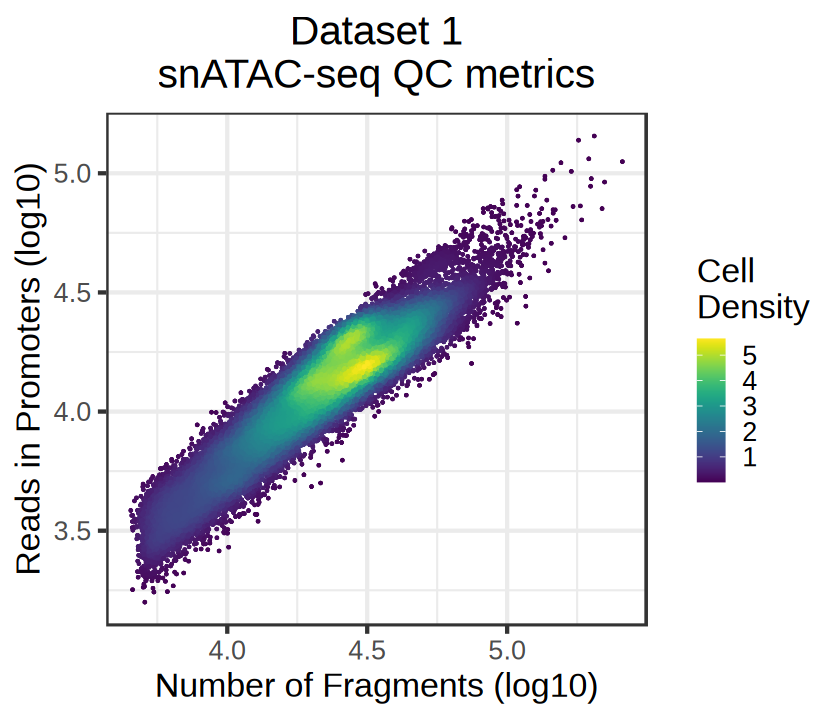

In [9]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nFrag'=log10(meta$nFrags),'log10_Prom'=log10(meta$ReadsInPromoter))
toPlot$density <- get_2D_density(toPlot$log10_nFrag,toPlot$log10_Prom,n=1000)

g <- ggplot(toPlot,aes(x=log10_nFrag,y=log10_Prom,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) + 
            labs(x='Number of Fragments (log10)',y='Reads in Promoters (log10)',
                 color='Cell\nDensity',title=paste(sep='\n',dataset_str_long,'snATAC-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_ATAC_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

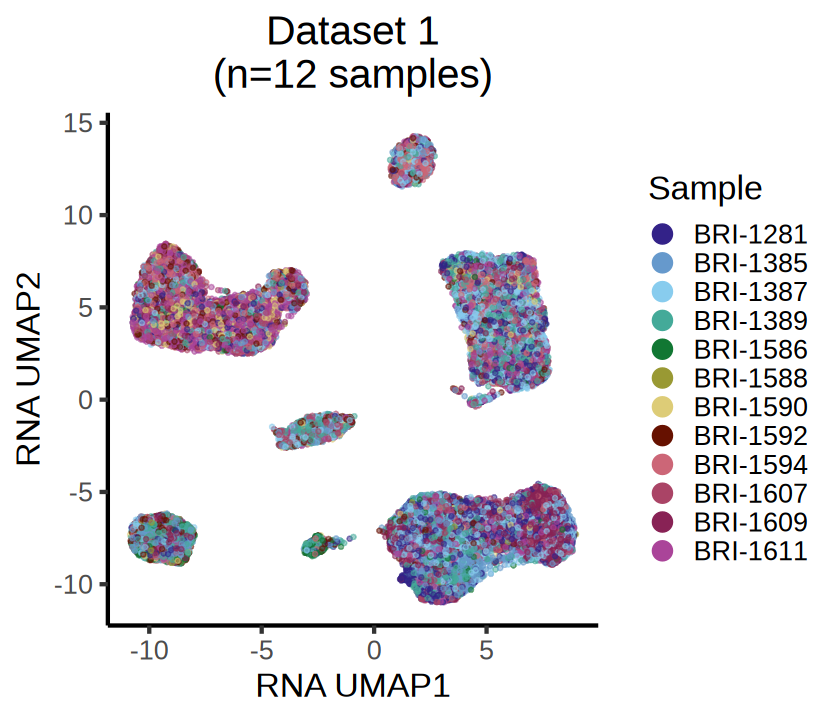

In [10]:
options(repr.plot.height=6,repr.plot.width=7)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),],aes(x=RNA_UMAP1,y=RNA_UMAP2,color=sample)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample',x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_sample',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

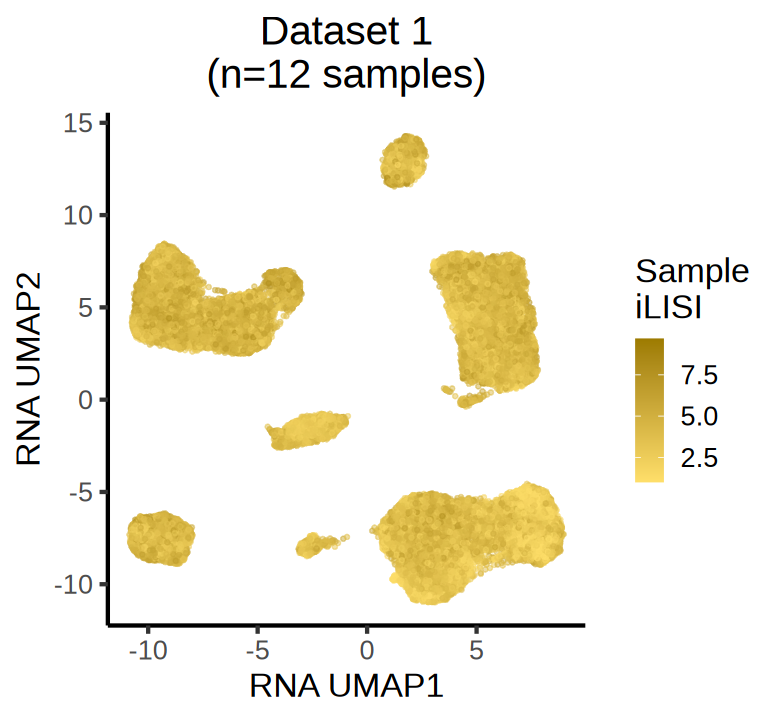

In [11]:
options(repr.plot.height=6,repr.plot.width=6.5)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),], aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_sample)) +
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=iLISI_low_color,high=iLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample\niLISI',x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiSample',file_extension),
           plot=g,units='in',height=6,width=6.5,dpi=300)
}

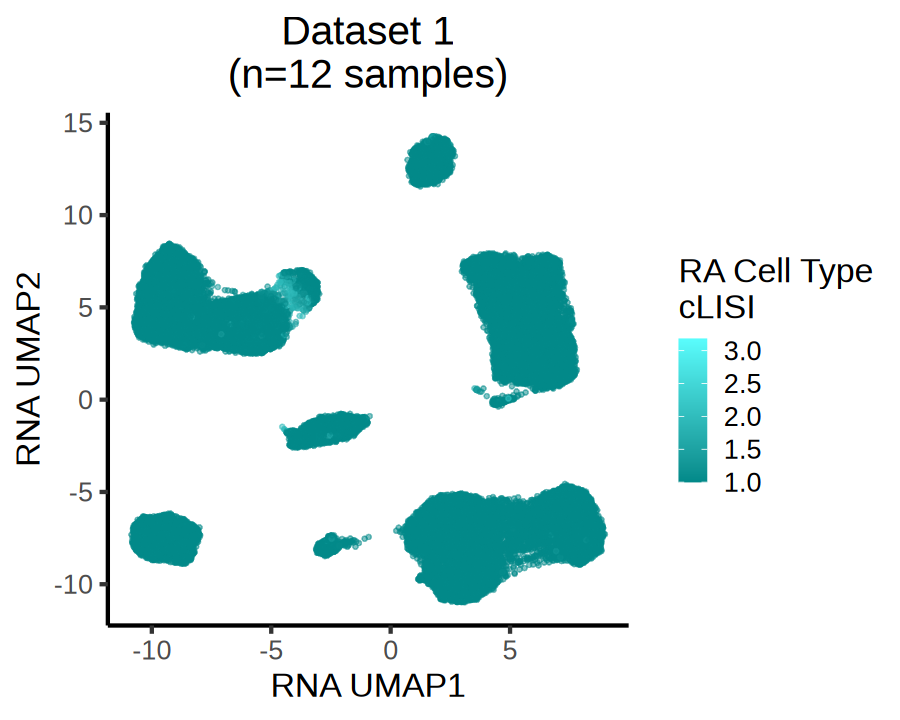

In [12]:
options(repr.plot.height=6,repr.plot.width=7.5)

g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=cLISI_low_color,high=cLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=paste(sep='\n',phenotype_str,'cLISI'),x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiPhenotype',file_extension),
           plot=g,units='in',height=6,width=7.5,dpi=300)
}

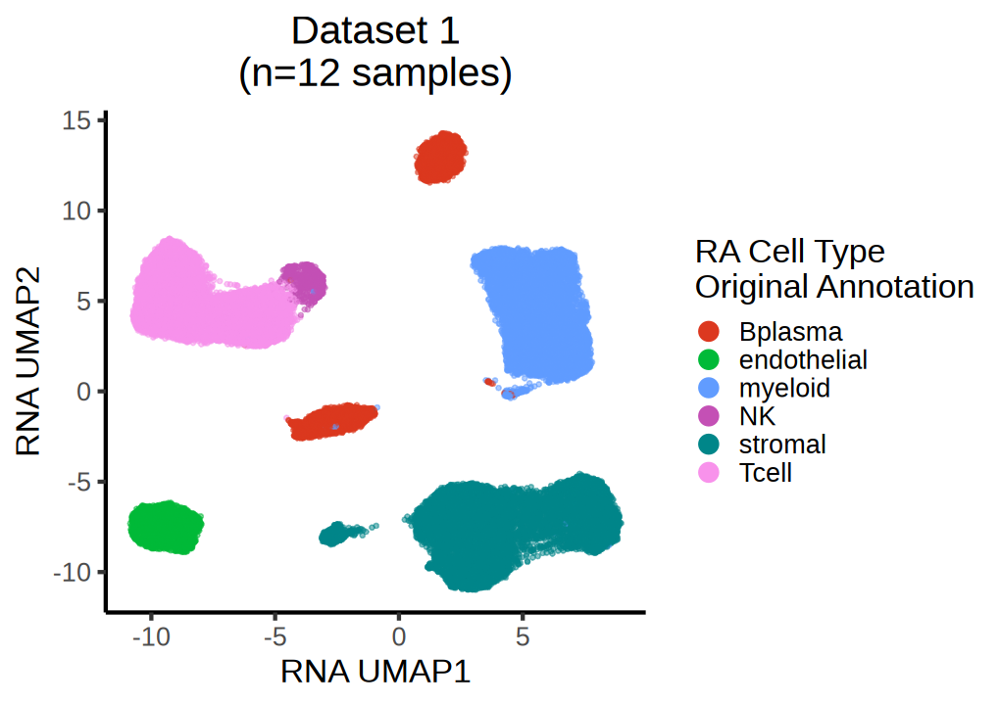

In [13]:
options(repr.plot.height=6,repr.plot.width=8.5)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=ori_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=sub(' - ','\n',ori_phenotype_str),x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_oriPheno',file_extension),
           plot=g,units='in',height=6,width=8.5,dpi=300)
}

In [14]:
chosenGenes <- c('CD3D','CD3G','NCAM1','NCR1','MS4A1','TNFRSF17','CD163','FCER1A','PDPN','PDGFRB','VWF','ERG')
if(!all(chosenGenes %in% rownames(gxCT_norm))) stop('missing genes')
if(any(duplicated(chosenGenes))) stop('duplciated genes')

phenotype_order <- c('Tcell','NK','Bplasma','myeloid','stromal','endothelial')
if(!all(phenotype_order %in% colnames(gxCT_norm))) stop('missing phenotypes')

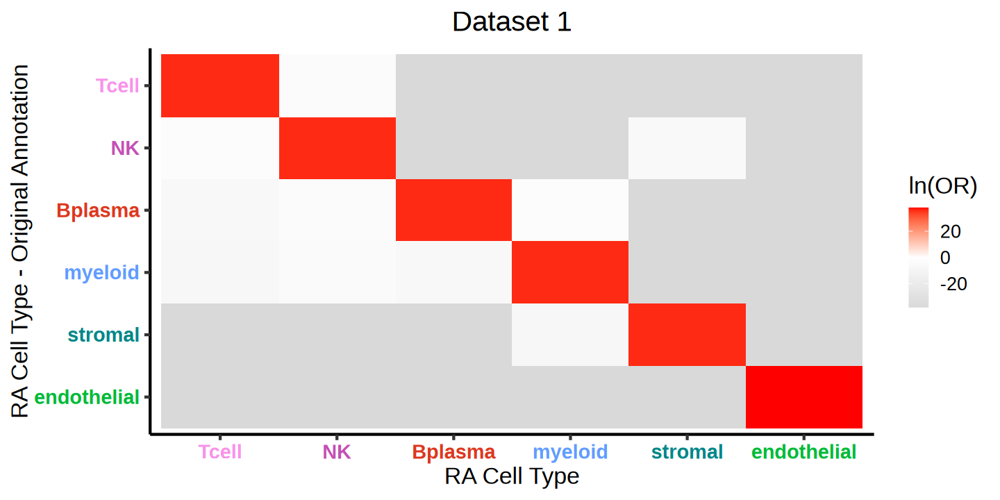

In [15]:
fisher_df <- calc_OR(meta, 'phenotype', 'ori_phenotype')

g <- plot_OR(fisher_df, 'phenotype', 'ori_phenotype',
             phenotype_str, ori_phenotype_str,
             phenotype_order, phenotype_order,
             clustColors=colors_vec)
g <- g + ggtitle(dataset_str_long) + theme(plot.title = element_text(hjust = 0.5)) 

options(repr.plot.height=6,repr.plot.width=12)
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_oriPhenolnOR',file_extension),
           plot=g,units='in',height=6,width=12,dpi=300)
}

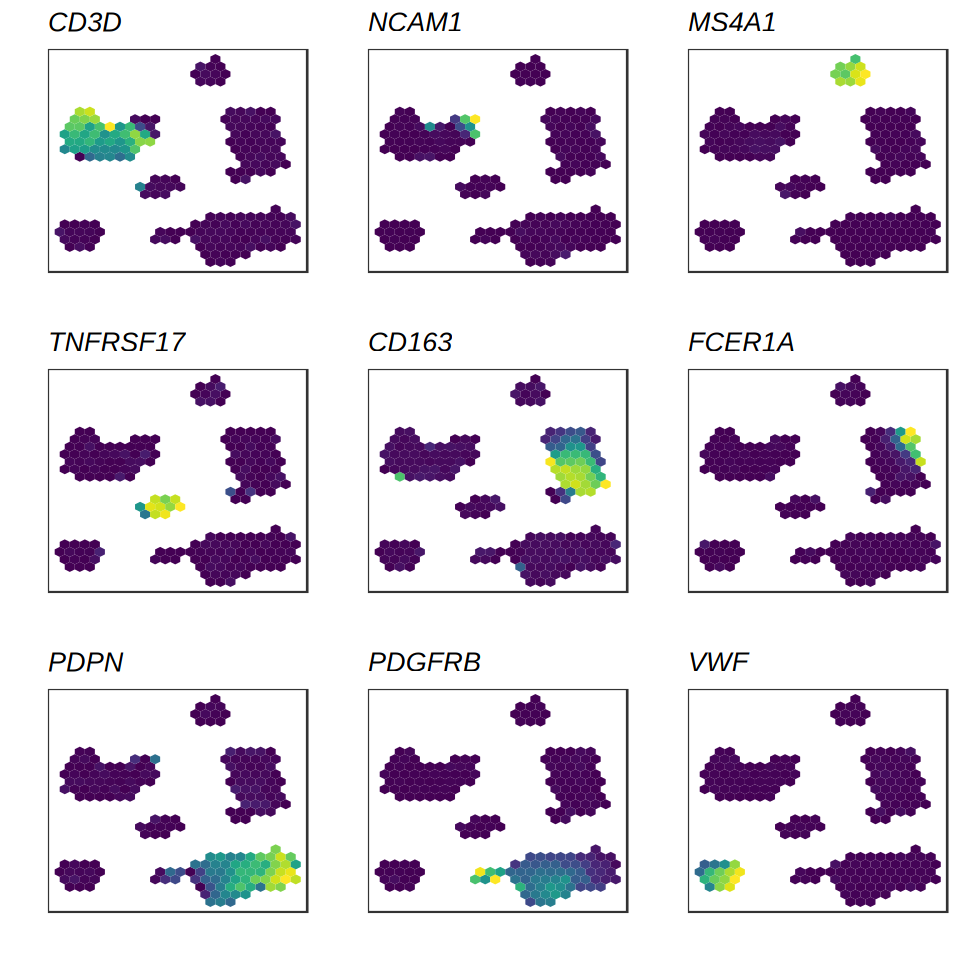

In [16]:
genes_forUMAPs <- c('CD3D','NCAM1','MS4A1','TNFRSF17','CD163','FCER1A','PDPN','PDGFRB','VWF')
if(!all(genes_forUMAPs %in% chosenGenes)) stop('Genes for UMAP not in chosen genes')

options(repr.plot.height=8,repr.plot.width=8)
g <- plot_markerPeaks_norm_hex_v2(meta, gxc_norm[,rownames(meta)],'RNA_UMAP1','RNA_UMAP2',
                                  plot_genes=genes_forUMAPs,plotCol=3,
                                  titleSize=16,hex_bins=23,cutCap=0)
grid.draw(g)

if(!is.na(save_dir)) ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_markerGeneExp',file_extension),
                            plot=g,units='in',height=8,width=8,dpi=300)

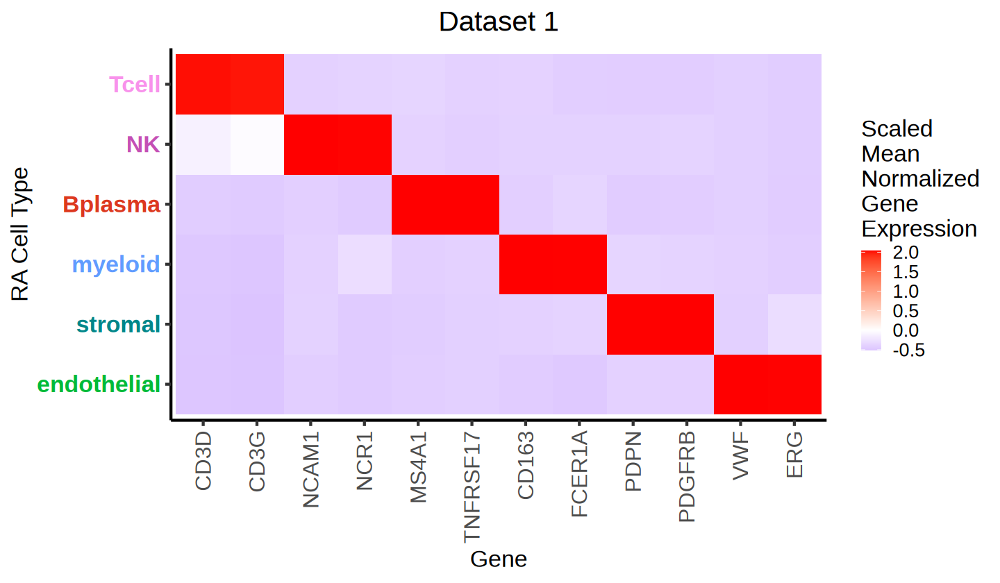

In [17]:
options(repr.plot.height=7,repr.plot.width=12)
g <- pseudobulk_scaled_heatmap(scaleGene_forHeatmap(chosenGenes,phenotype_order,gxCT_norm),
                               'Gene',phenotype_str,
                               'Scaled\nMean\nNormalized\nGene\nExpression',
                               plotTit=dataset_str_long,
                               clustColors=colors_vec)
g <- g + theme(axis.text.x = element_text(size=19))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_markerGeneExp',file_extension),
           plot=g,units='in',height=7,width=12,dpi=300)
}

## Dataset 2

In [18]:
data_dir <- paste(sep='',input_dir,'dataset2/')
dataset_str <- 'dataset2'
dataset_str_long <- 'Dataset 2'
phenotype_str <- 'RA T Cell State'
ori_phenotype_str <- 'RA T Cell Chromatin Class'
sample_str <- '(n=11 samples)'

meta <- readRDS(paste(sep='',data_dir,dataset_str,'_meta.rds'))
gxc_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm.rds'))
gxCT_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm_phenotype_meanAggr.rds'))

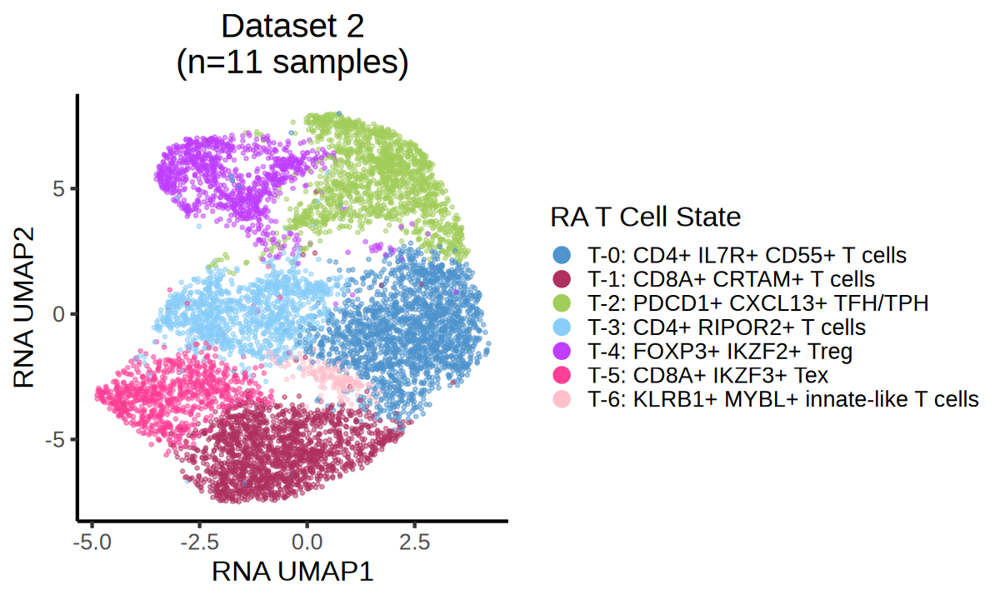

In [19]:
options(repr.plot.height=6,repr.plot.width=10)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=phenotype_str,x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_phenotype',file_extension),
           plot=g,units='in',height=6,width=10,dpi=300)
}

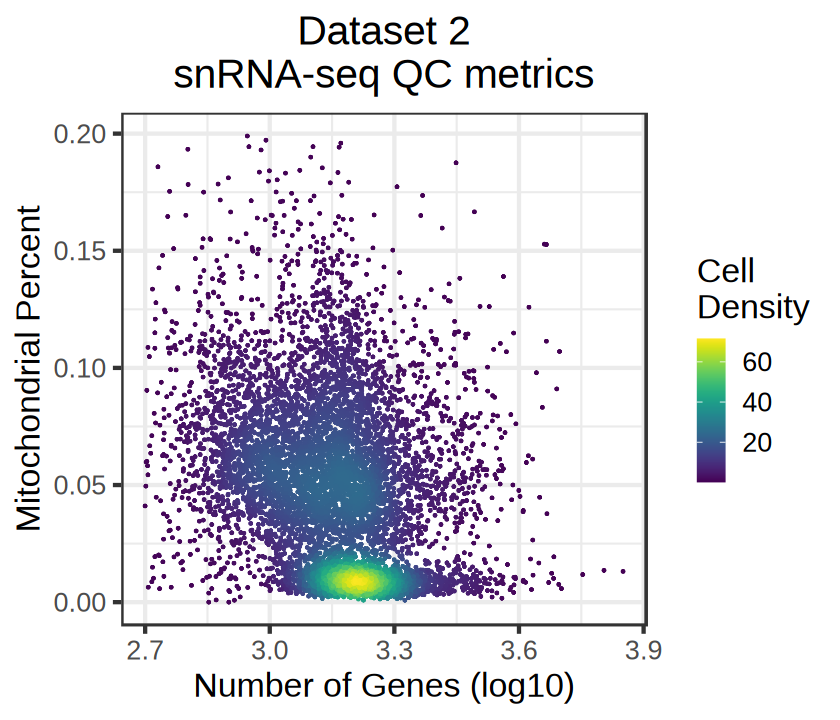

In [20]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nGene'=log10(meta$nGene),'MTperc'=meta$MTperc)
toPlot$density <- get_2D_density(toPlot$log10_nGene,toPlot$MTperc,n=1000)

g <- ggplot(toPlot,aes(x=log10_nGene,y=MTperc,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) +
            labs(x='Number of Genes (log10)',y='Mitochondrial Percent',color='Cell\nDensity',
                 title=paste(sep='\n',dataset_str_long,'snRNA-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_RNA_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

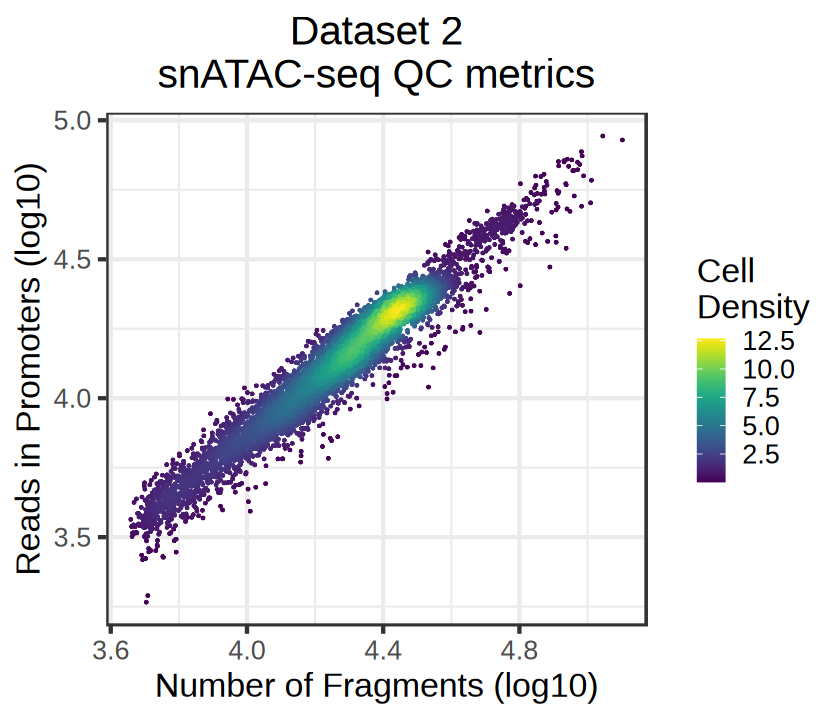

In [21]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nFrag'=log10(meta$nFrags),'log10_Prom'=log10(meta$ReadsInPromoter))
toPlot$density <- get_2D_density(toPlot$log10_nFrag,toPlot$log10_Prom,n=1000)

g <- ggplot(toPlot,aes(x=log10_nFrag,y=log10_Prom,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) + 
            labs(x='Number of Fragments (log10)',y='Reads in Promoters (log10)',
                 color='Cell\nDensity',title=paste(sep='\n',dataset_str_long,'snATAC-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_ATAC_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

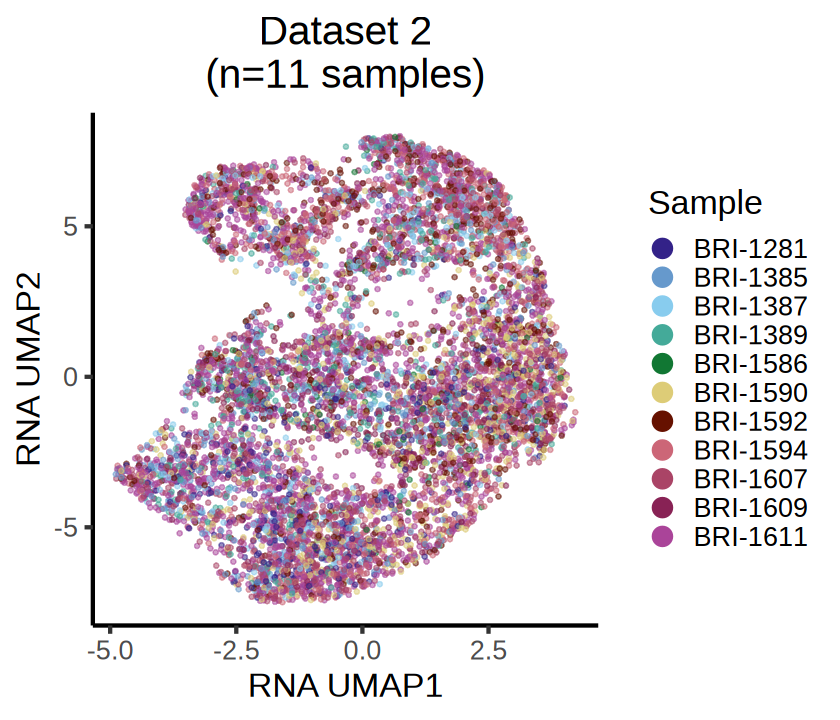

In [22]:
options(repr.plot.height=6,repr.plot.width=7)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),],aes(x=RNA_UMAP1,y=RNA_UMAP2,color=sample)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample',x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_sample',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

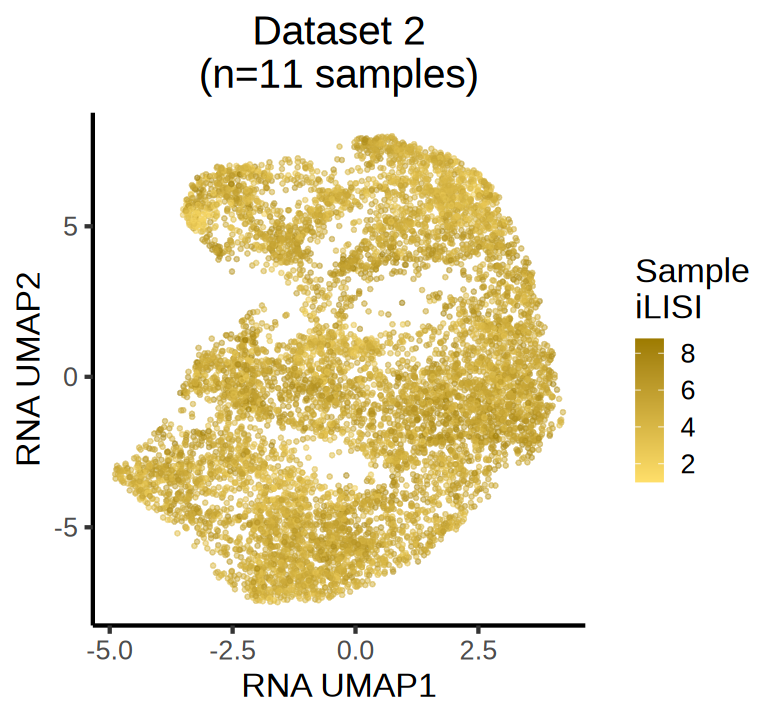

In [23]:
options(repr.plot.height=6,repr.plot.width=6.5)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),], aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_sample)) +
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=iLISI_low_color,high=iLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample\niLISI',x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiSample',file_extension),
           plot=g,units='in',height=6,width=6.5,dpi=300)
}

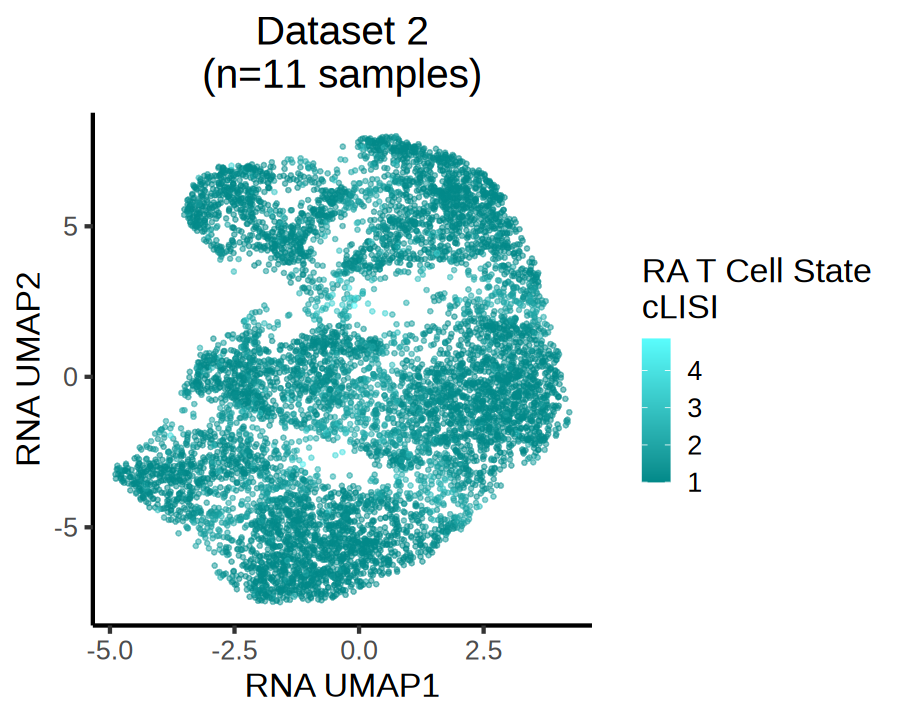

In [24]:
options(repr.plot.height=6,repr.plot.width=7.5)

g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=cLISI_low_color,high=cLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=paste(sep='\n',phenotype_str,'cLISI'),x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiPhenotype',file_extension),
           plot=g,units='in',height=6,width=7.5,dpi=300)
}

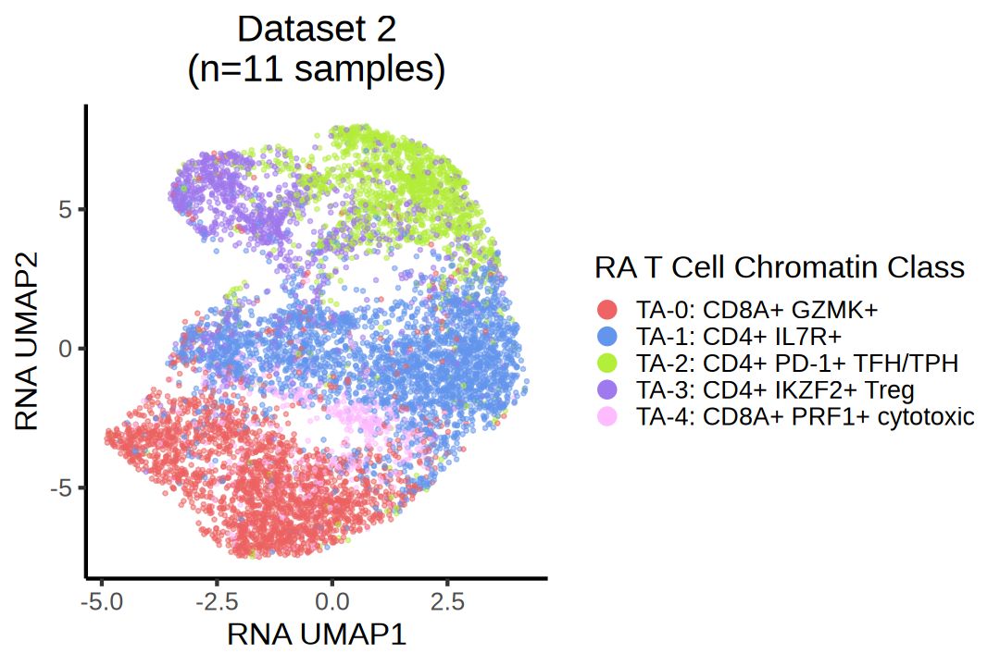

In [25]:
options(repr.plot.height=6,repr.plot.width=9)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=ori_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=sub(' - ','\n',ori_phenotype_str),x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_oriPheno',file_extension),
           plot=g,units='in',height=6,width=9,dpi=300)
}

In [26]:
chosenGenes <- c('CD8A','CRTAM','GZMB','CCL4','RUNX3','ZEB2','GZMK',
                 'IKZF3','SAMD3',
                 'KLRB1','MYBL1','GNLY','PLCB1','CCR6','ZBTB16',
                 'IL7R','CD55','BACH2','GPR183','ZBTB10','SLC2A3','SPDYA',
                 'CPQ','ERCC1','RIPOR2','SMIM41','PRMT2','TPD52','TXK',
                 'CD4','PDCD1','CXCL13','PTPN13','PDE7B',
                 'FOXP3','IKZF2','IL2RA','RTKN2')
if(!all(chosenGenes %in% rownames(gxCT_norm))) stop('missing genes')
if(any(duplicated(chosenGenes))) stop('duplciated genes')

phenotype_order <- paste(sep='','T-',c(1,5,6,0,3,2,4))
if(!all(phenotype_order %in% colnames(gxCT_norm))) stop('missing phenotypes')

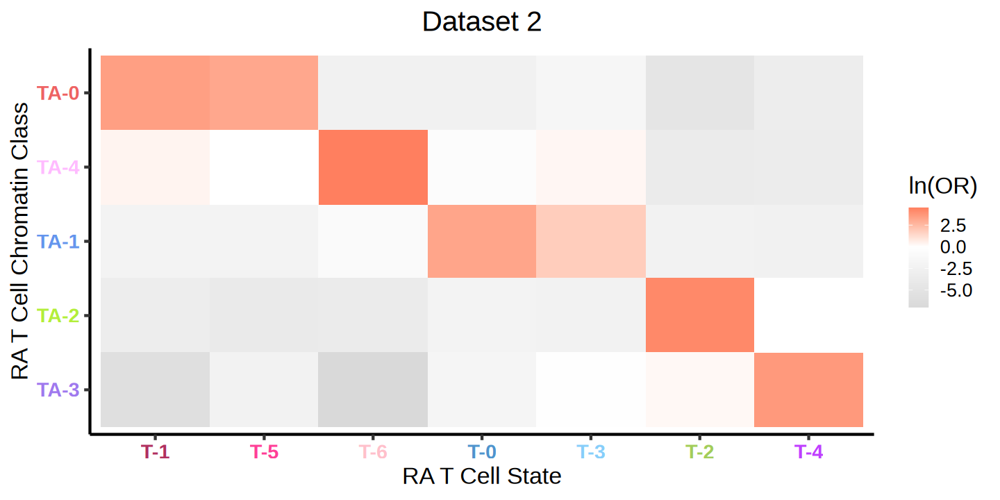

In [27]:
fisher_df <- calc_OR(meta, 'phenotype_abbr', 'ori_phenotype_abbr')

g <- plot_OR(fisher_df, 'phenotype_abbr', 'ori_phenotype_abbr',
             phenotype_str, ori_phenotype_str,
             phenotype_order, c('TA-0','TA-4','TA-1','TA-2','TA-3'),
             clustColors=colors_vec)
g <- g + ggtitle(dataset_str_long) + theme(plot.title = element_text(hjust = 0.5)) 

options(repr.plot.height=6,repr.plot.width=12)
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_oriPhenolnOR',file_extension),
           plot=g,units='in',height=6,width=12,dpi=300)
}

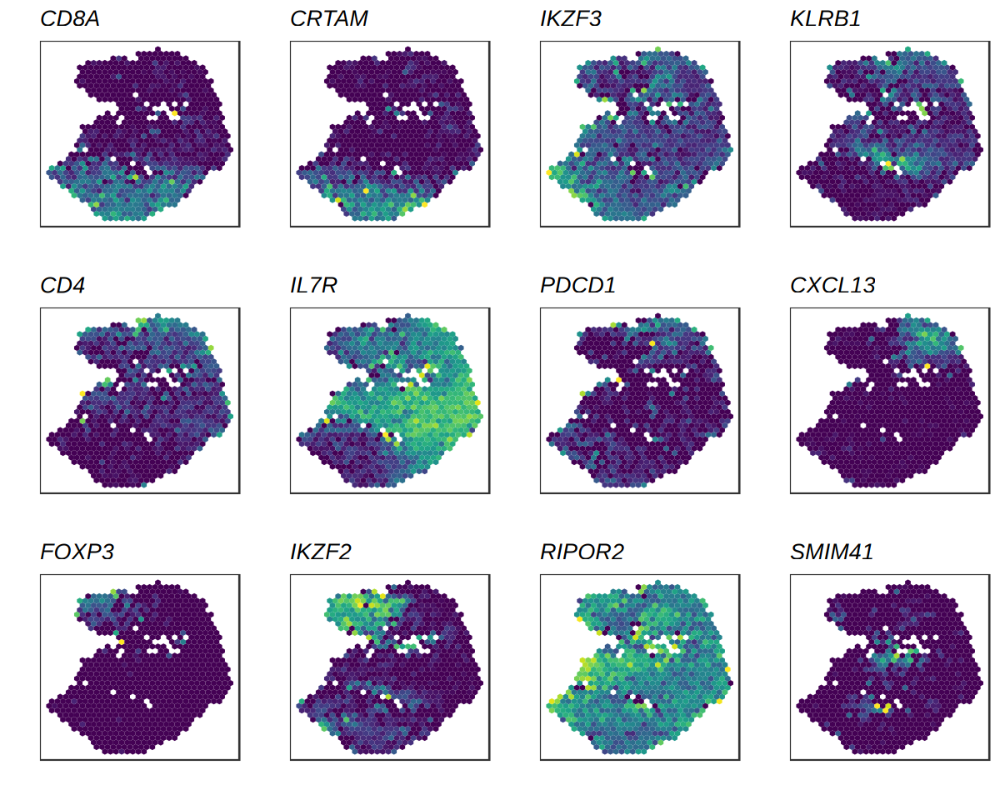

In [28]:
genes_forUMAPs <- c('CD8A','CRTAM','IKZF3','KLRB1',
                    'CD4','IL7R','PDCD1','CXCL13','FOXP3','IKZF2','RIPOR2','SMIM41')
if(!all(genes_forUMAPs %in% chosenGenes)) stop('Genes for UMAP not in chosen genes')

options(repr.plot.height=8,repr.plot.width=10)
g <- plot_markerPeaks_norm_hex_v2(meta, gxc_norm[,rownames(meta)],'RNA_UMAP1','RNA_UMAP2',
                                  plot_genes=genes_forUMAPs,plotCol=4,
                                  titleSize=16,hex_bins=32,cutCap=0)
grid.draw(g)

if(!is.na(save_dir)) ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_markerGeneExp',file_extension),
                            plot=g,units='in',height=8,width=10,dpi=300)

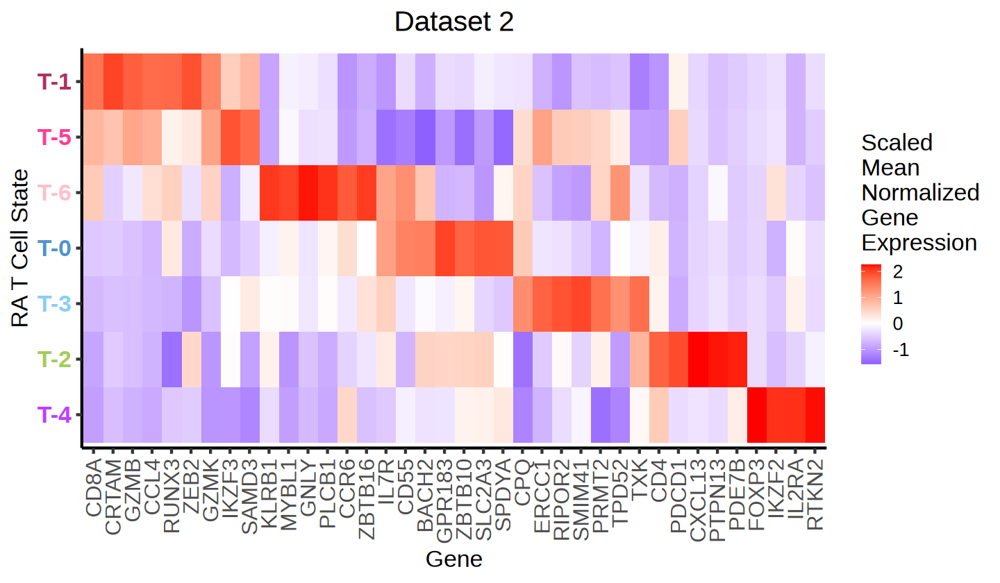

In [29]:
options(repr.plot.height=7,repr.plot.width=12)
g <- pseudobulk_scaled_heatmap(scaleGene_forHeatmap(chosenGenes,phenotype_order,gxCT_norm),
                               'Gene',phenotype_str,
                               'Scaled\nMean\nNormalized\nGene\nExpression',
                               plotTit=dataset_str_long,
                               clustColors=colors_vec)
g <- g + theme(axis.text.x = element_text(size=19))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_markerGeneExp',file_extension),
           plot=g,units='in',height=7,width=12,dpi=300)
}

## Dataset 3

In [30]:
data_dir <- paste(sep='',input_dir,'dataset3/')
dataset_str <- 'dataset3'
dataset_str_long <- 'Dataset 3'
phenotype_str <- 'RA FACS\nT Cell Substate'
sample_str <- '(n=2 runs)'

meta <- readRDS(paste(sep='',data_dir,dataset_str,'_meta.rds'))

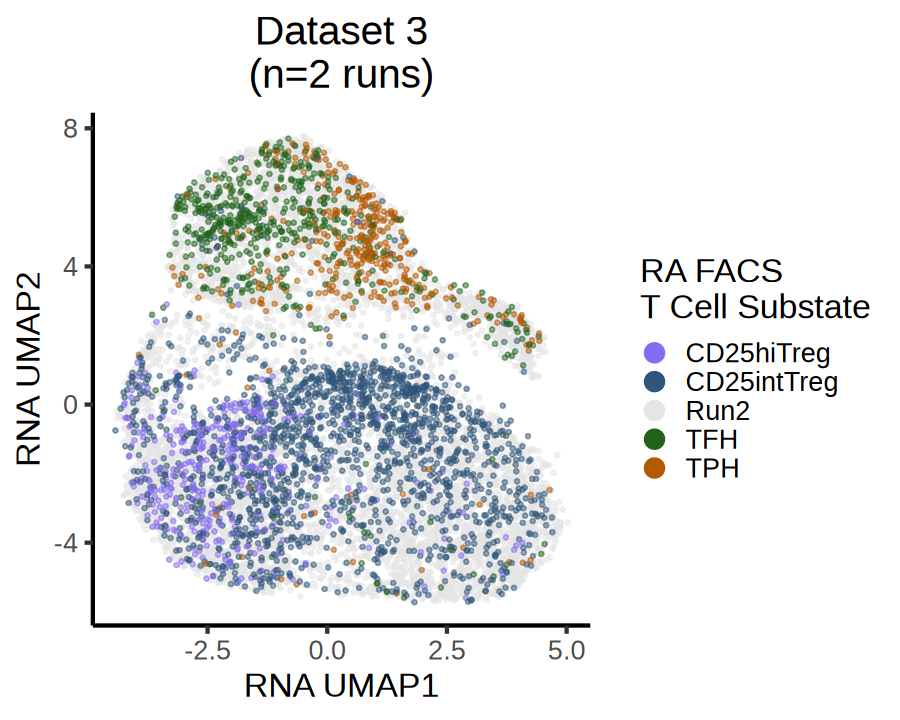

In [31]:
options(repr.plot.height=6,repr.plot.width=7.5)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=phenotype_str,x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_phenotype',file_extension),
           plot=g,units='in',height=6,width=7.5,dpi=300)
}

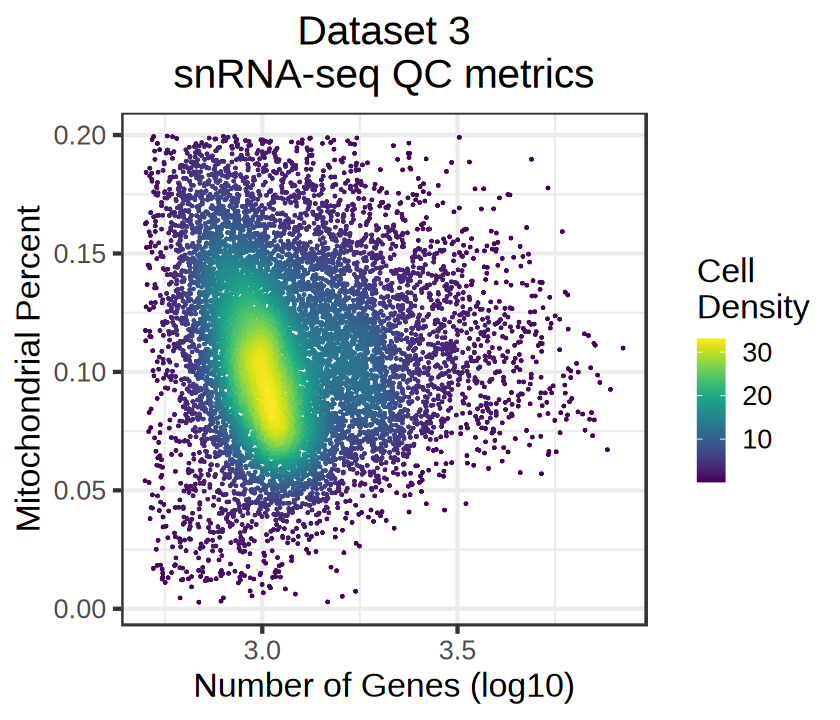

In [32]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nGene'=log10(meta$nGene),'MTperc'=meta$MTperc)
toPlot$density <- get_2D_density(toPlot$log10_nGene,toPlot$MTperc,n=1000)

g <- ggplot(toPlot,aes(x=log10_nGene,y=MTperc,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) +
            labs(x='Number of Genes (log10)',y='Mitochondrial Percent',color='Cell\nDensity',
                 title=paste(sep='\n',dataset_str_long,'snRNA-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_RNA_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

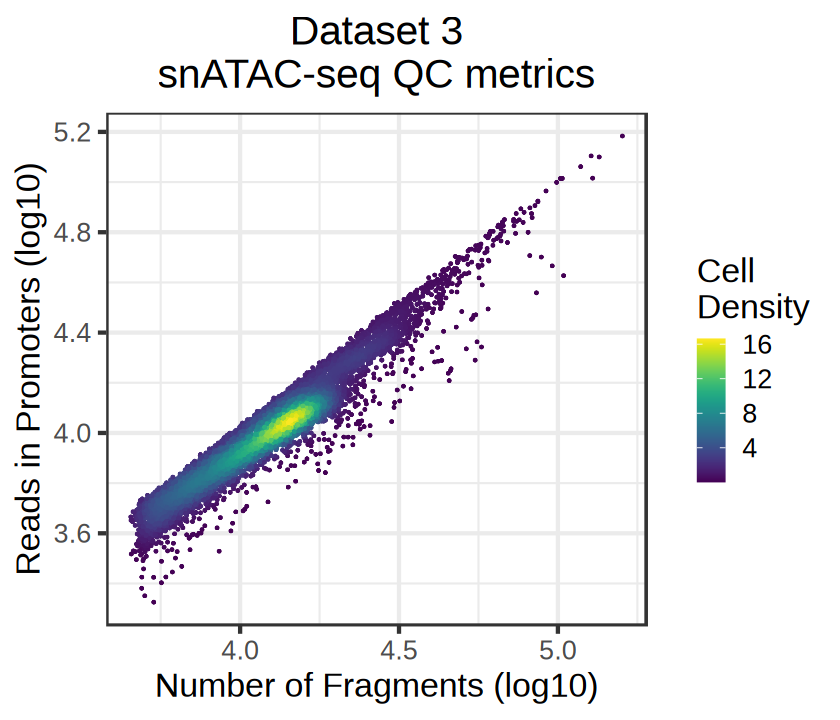

In [33]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nFrag'=log10(meta$nFrags),'log10_Prom'=log10(meta$ReadsInPromoter))
toPlot$density <- get_2D_density(toPlot$log10_nFrag,toPlot$log10_Prom,n=1000)

g <- ggplot(toPlot,aes(x=log10_nFrag,y=log10_Prom,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) + 
            labs(x='Number of Fragments (log10)',y='Reads in Promoters (log10)',
                 color='Cell\nDensity',title=paste(sep='\n',dataset_str_long,'snATAC-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_ATAC_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

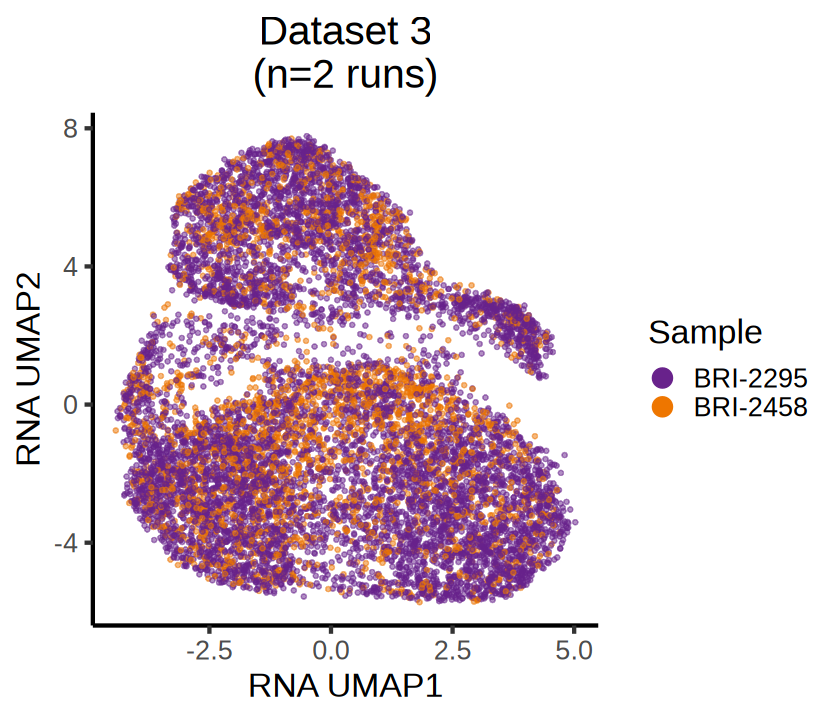

In [34]:
options(repr.plot.height=6,repr.plot.width=7)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),],aes(x=RNA_UMAP1,y=RNA_UMAP2,color=sample)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample',x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_sample',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

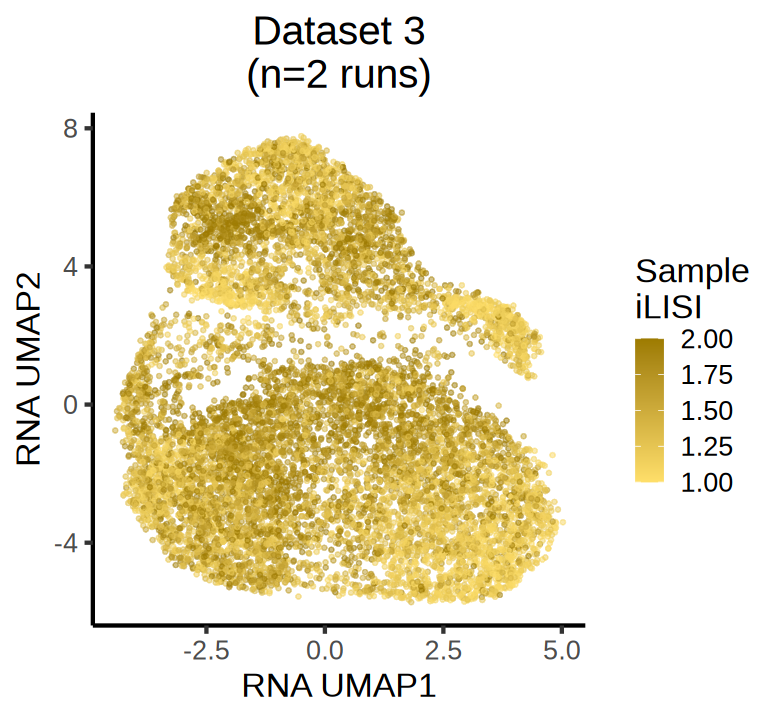

In [35]:
options(repr.plot.height=6,repr.plot.width=6.5)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),], aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_sample)) +
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=iLISI_low_color,high=iLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample\niLISI',x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiSample',file_extension),
           plot=g,units='in',height=6,width=6.5,dpi=300)
}

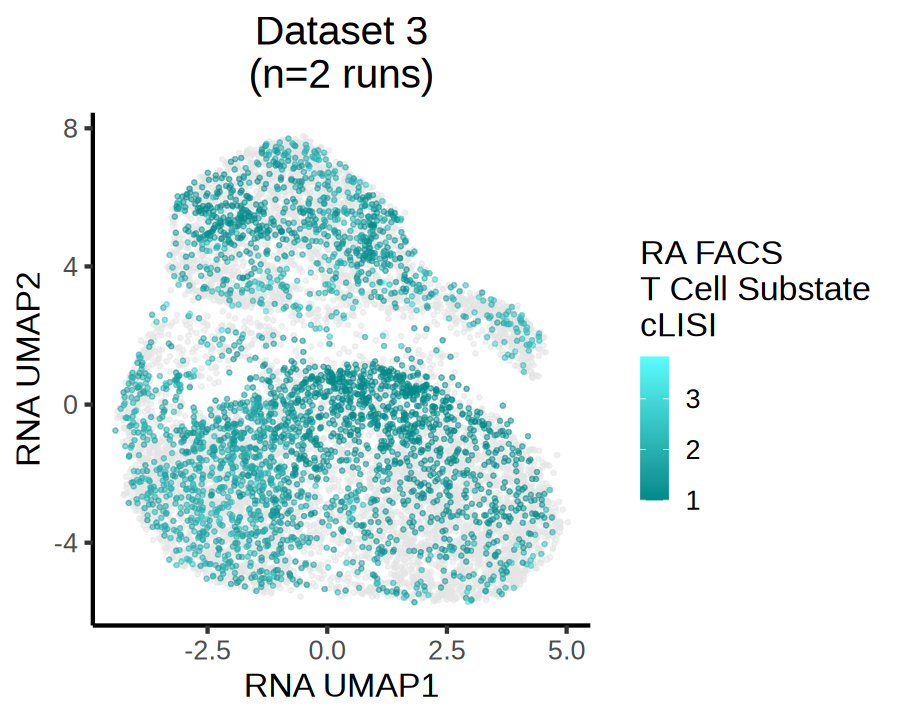

In [36]:
options(repr.plot.height=6,repr.plot.width=7.5)

g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=cLISI_low_color,high=cLISI_high_color,limits=c(1,NA),na.value=colors_vec['R2']) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=paste(sep='\n',phenotype_str,'cLISI'),x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiPhenotype',file_extension),
           plot=g,units='in',height=6,width=7.5,dpi=300)
}

## Dataset 4

In [37]:
data_dir <- paste(sep='',input_dir,'dataset4/')
dataset_str <- 'dataset4'
dataset_str_long <- 'Dataset 4'
phenotype_str <- 'PBMC/HSPC\nCell Type'
ori_phenotype_str <- 'PBMC/HSPC Cell Type\nOriginal Annotation'
sample_str <- '(n=30 samples)'

meta <- readRDS(paste(sep='',data_dir,dataset_str,'_meta.rds'))
gxc_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm.rds'))
gxCT_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm_phenotype_meanAggr.rds'))

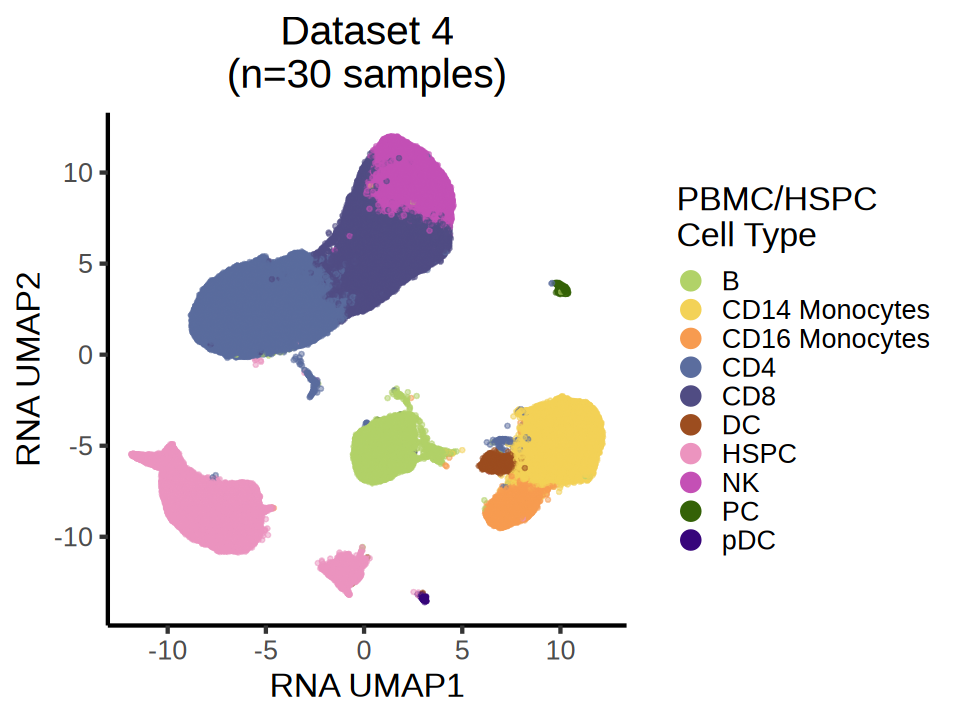

In [38]:
options(repr.plot.height=6,repr.plot.width=8)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=phenotype_str,x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_phenotype',file_extension),
           plot=g,units='in',height=6,width=8,dpi=300)
}

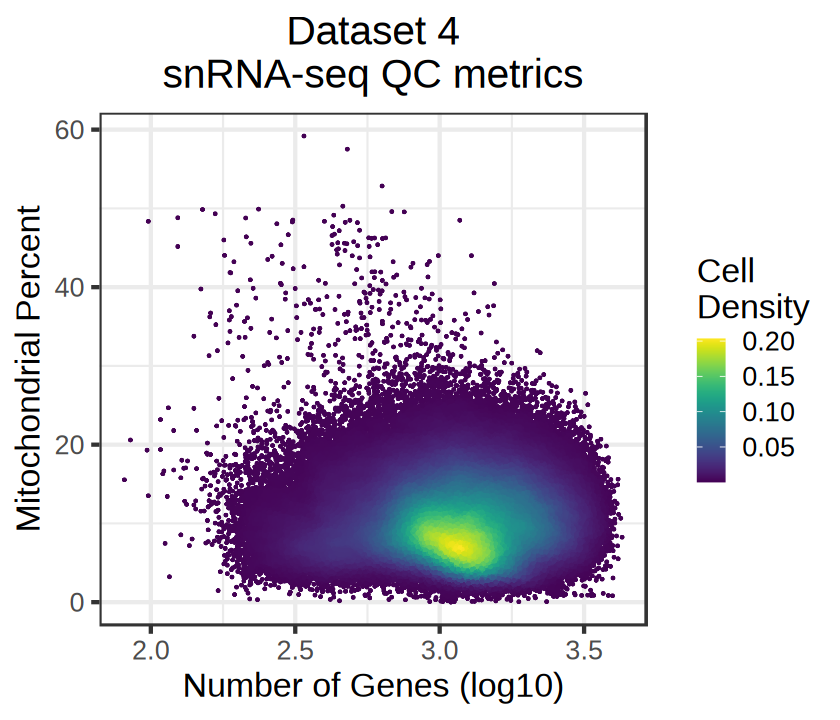

In [39]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nGene'=log10(meta$nGene),'MTperc'=meta$MTperc)
toPlot$density <- get_2D_density(toPlot$log10_nGene,toPlot$MTperc,n=1000)

g <- ggplot(toPlot,aes(x=log10_nGene,y=MTperc,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) +
            labs(x='Number of Genes (log10)',y='Mitochondrial Percent',color='Cell\nDensity',
                 title=paste(sep='\n',dataset_str_long,'snRNA-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_RNA_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

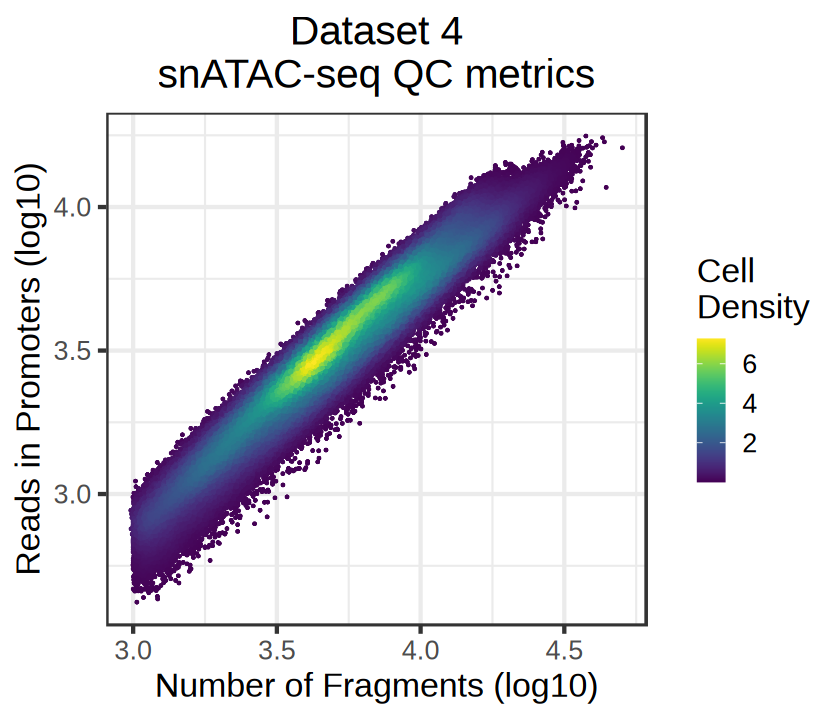

In [40]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nFrag'=log10(meta$nFrags),'log10_Prom'=log10(meta$ReadsInPromoter))
toPlot$density <- get_2D_density(toPlot$log10_nFrag,toPlot$log10_Prom,n=1000)

g <- ggplot(toPlot,aes(x=log10_nFrag,y=log10_Prom,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) + 
            labs(x='Number of Fragments (log10)',y='Reads in Promoters (log10)',
                 color='Cell\nDensity',title=paste(sep='\n',dataset_str_long,'snATAC-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_ATAC_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

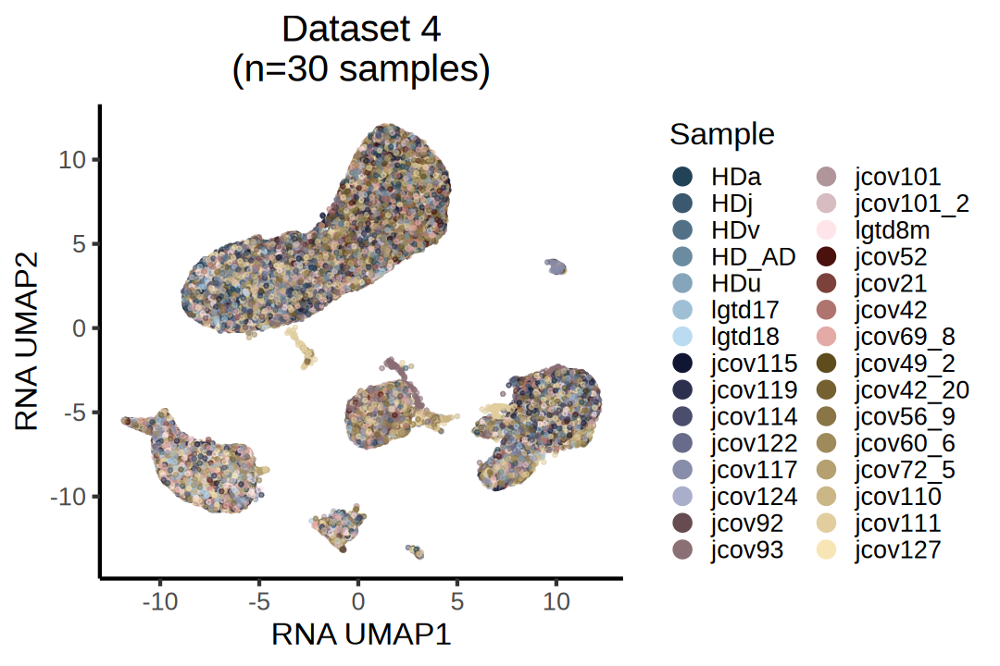

In [41]:
options(repr.plot.height=6,repr.plot.width=9)

meta$sample <- factor(meta$sample,levels=grep('HD|jcov|lgtd',names(colors_vec),value=TRUE))

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),],aes(x=RNA_UMAP1,y=RNA_UMAP2,color=sample)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample',x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_sample',file_extension),
           plot=g,units='in',height=6,width=9,dpi=300)
}

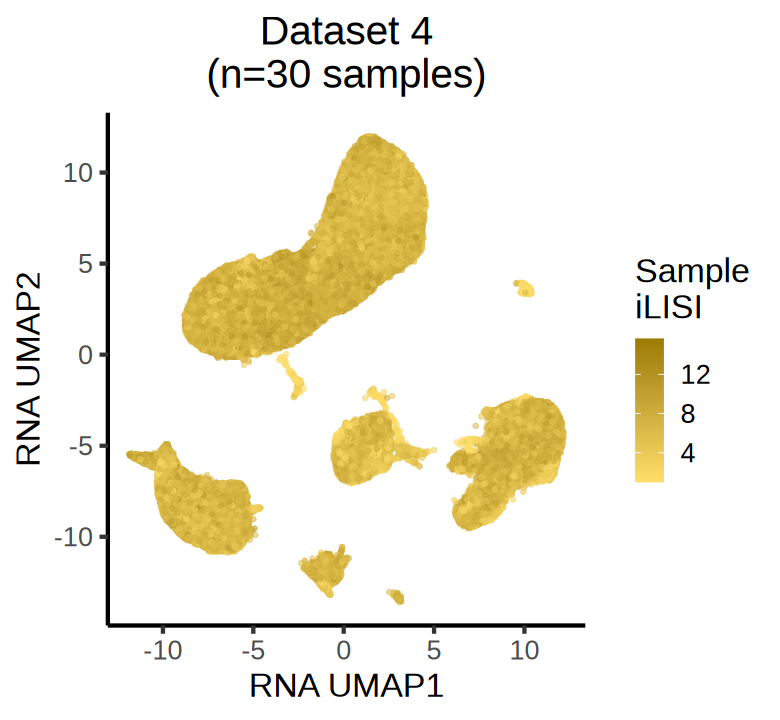

In [42]:
options(repr.plot.height=6,repr.plot.width=6.5)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),], aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_sample)) +
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=iLISI_low_color,high=iLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample\niLISI',x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiSample',file_extension),
           plot=g,units='in',height=6,width=6.5,dpi=300)
}

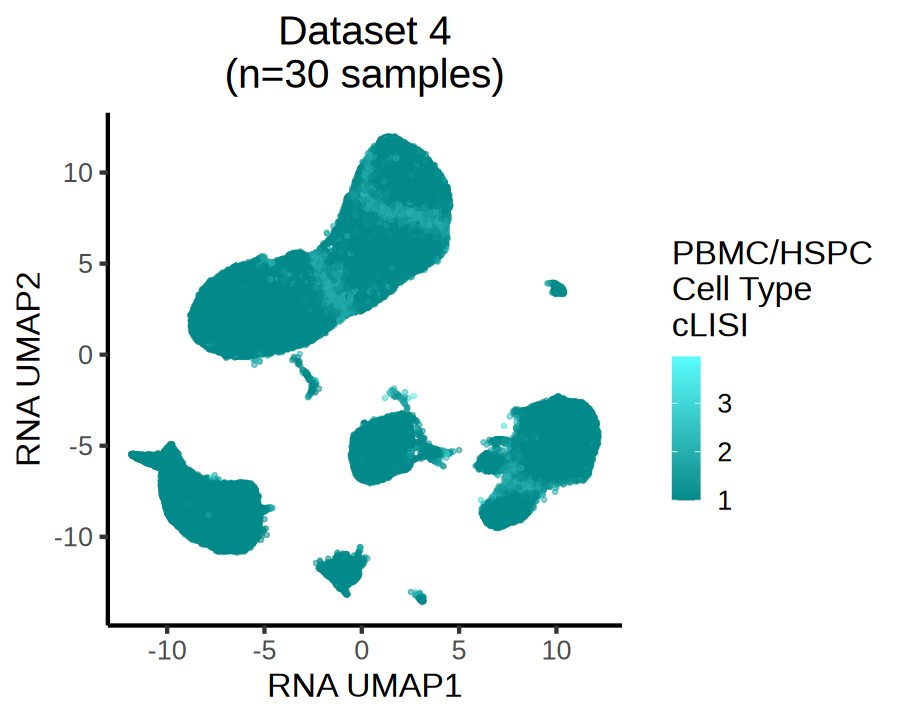

In [43]:
options(repr.plot.height=6,repr.plot.width=7.5)

g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=cLISI_low_color,high=cLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=paste(sep='\n',phenotype_str,'cLISI'),x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiPhenotype',file_extension),
           plot=g,units='in',height=6,width=7.5,dpi=300)
}

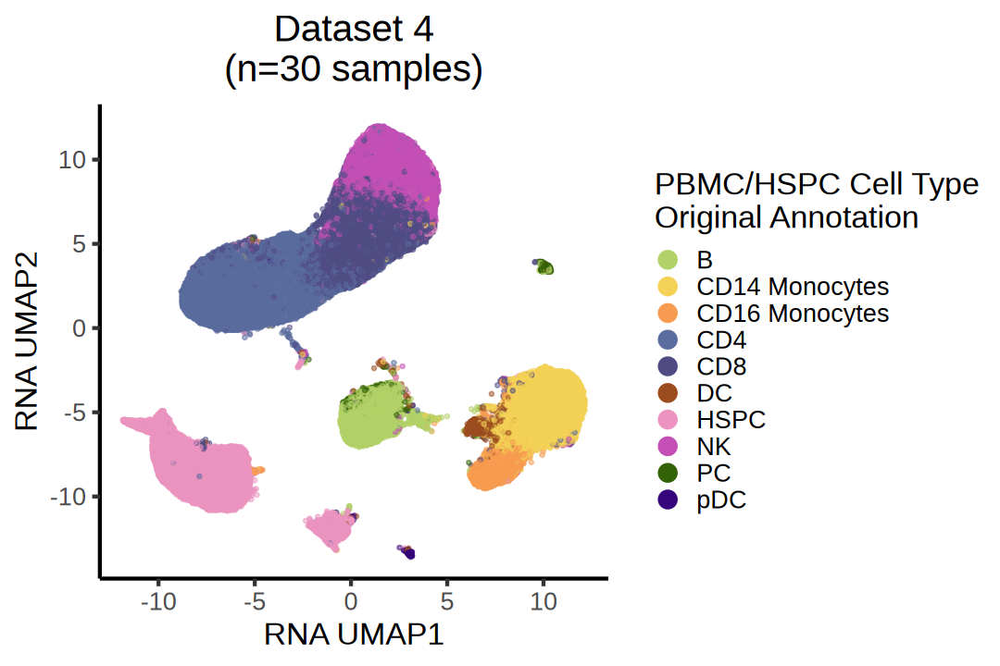

In [44]:
options(repr.plot.height=6,repr.plot.width=9)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=ori_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=sub(' - ','\n',ori_phenotype_str),x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_oriPheno',file_extension),
           plot=g,units='in',height=6,width=9,dpi=300)
}

In [45]:
chosenGenes <- c("MS4A1","BANK1","FCER2",
                 "MZB1","XBP1","JCHAIN",
                 "CLEC4C","TCF4","RUNX2","CD1C","CLEC10A","FCER1A","CST3",
                 "CD14","VCAN","DPYD",
                 "FCGR3A","TCF7L2",
                 "CD4","IL7R","LEF1","CAMK4","CCR7",
                 "THEMIS","CD3D",
                 "CD8A",
                 "CCL4","PRF1","NCAM1","KLRC1",
                 "CD34","CDK6","ZNF385D")
if(!all(chosenGenes %in% rownames(gxCT_norm))) stop('missing genes')
if(any(duplicated(chosenGenes))) stop('duplciated genes')

phenotype_order <- c('B','PC','pDC','DC','CD14Mono','CD16Mono','CD4','CD8','NK','HSPC')
if(!all(phenotype_order %in% colnames(gxCT_norm))) stop('missing phenotypes')

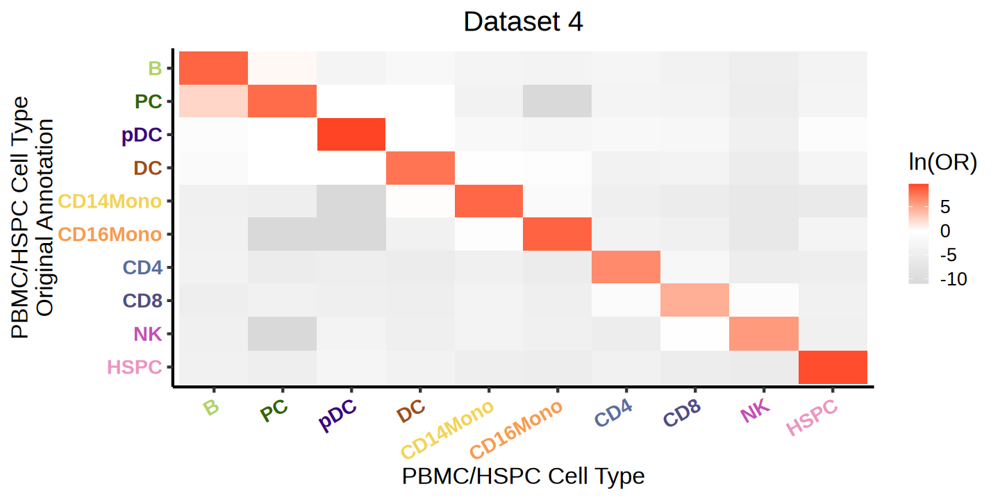

In [46]:
fisher_df <- calc_OR(meta, 'phenotype_abbr', 'ori_phenotype_abbr')

g <- plot_OR(fisher_df, 'phenotype_abbr', 'ori_phenotype_abbr',
             sub('\n',' ',phenotype_str), ori_phenotype_str,
             phenotype_order, phenotype_order,
             clustColors=colors_vec)
g <- g + ggtitle(dataset_str_long) + 
        theme(plot.title = element_text(hjust = 0.5),axis.text.x = element_text(angle = 30, vjust = 1, hjust=1)) 

options(repr.plot.height=6,repr.plot.width=12)
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_oriPhenolnOR',file_extension),
           plot=g,units='in',height=6,width=12,dpi=300)
}

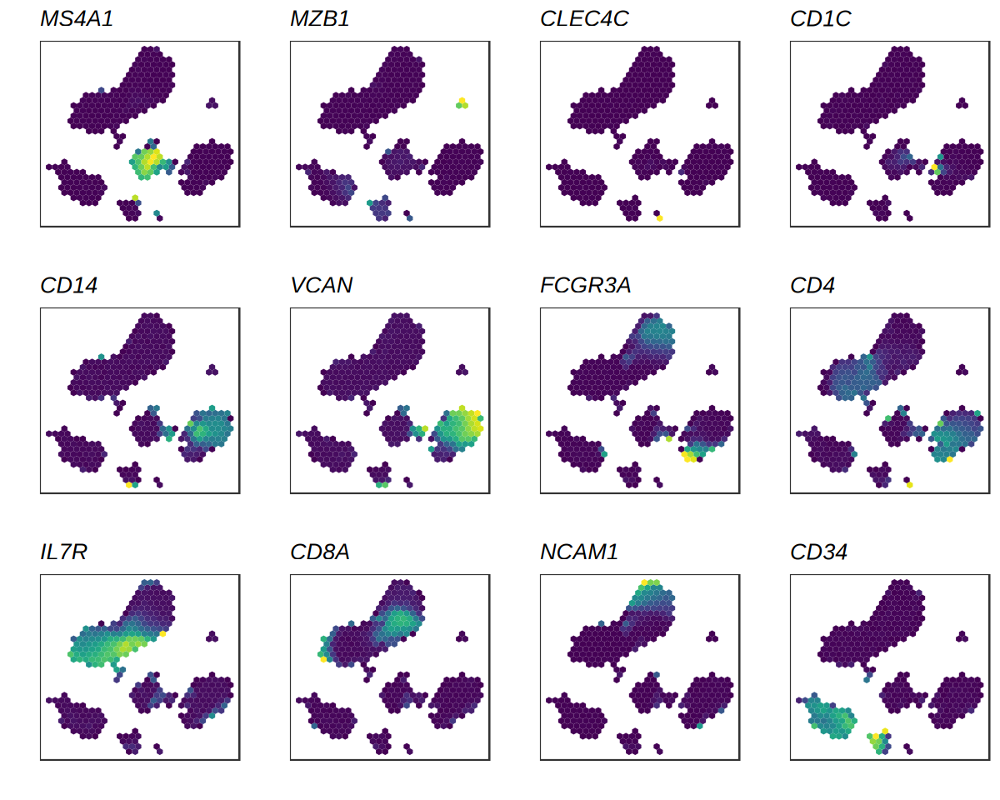

In [47]:
genes_forUMAPs <- c('MS4A1','MZB1','CLEC4C','CD1C','CD14','VCAN','FCGR3A','CD4','IL7R','CD8A','NCAM1','CD34') 
if(!all(genes_forUMAPs %in% chosenGenes)) stop('Genes for UMAP not in chosen genes')

options(repr.plot.height=8,repr.plot.width=10)
g <- plot_markerPeaks_norm_hex_v2(meta, gxc_norm[,rownames(meta)],'RNA_UMAP1','RNA_UMAP2',
                                  plot_genes=genes_forUMAPs,plotCol=4,
                                  titleSize=16,hex_bins=29,cutCap=0)
grid.draw(g)

if(!is.na(save_dir)) ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_markerGeneExp',file_extension),
                            plot=g,units='in',height=8,width=10,dpi=300)

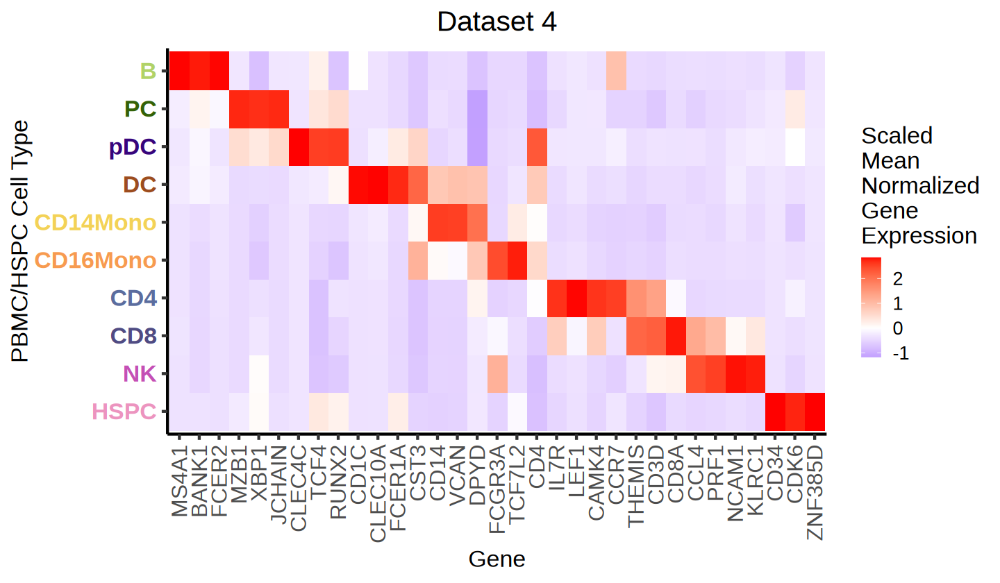

In [48]:
options(repr.plot.height=7,repr.plot.width=12)
g <- pseudobulk_scaled_heatmap(scaleGene_forHeatmap(chosenGenes,phenotype_order,gxCT_norm),
                               'Gene',sub('\n',' ',phenotype_str),
                               'Scaled\nMean\nNormalized\nGene\nExpression',
                               plotTit=dataset_str_long,
                               clustColors=colors_vec)
g <- g + theme(axis.text.x = element_text(size=19))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_markerGeneExp',file_extension),
           plot=g,units='in',height=7,width=12,dpi=300)
}

## Dataset 5

In [49]:
data_dir <- paste(sep='',input_dir,'dataset5/')
dataset_str <- 'dataset5'
dataset_str_long <- 'Dataset 5'
phenotype_str <- 'HSPC Cell State'
ori_phenotype_str <- 'HSPC Cell State - Original Annotation'
sample_str <- '(n=28 samples)'

meta <- readRDS(paste(sep='',data_dir,dataset_str,'_meta.rds'))
gxc_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm.rds'))
gxCT_norm <- readRDS(paste(sep='',data_dir,'/RNA/PCA_Harmony/',dataset_str,'_gene_norm_phenotype_meanAggr.rds'))

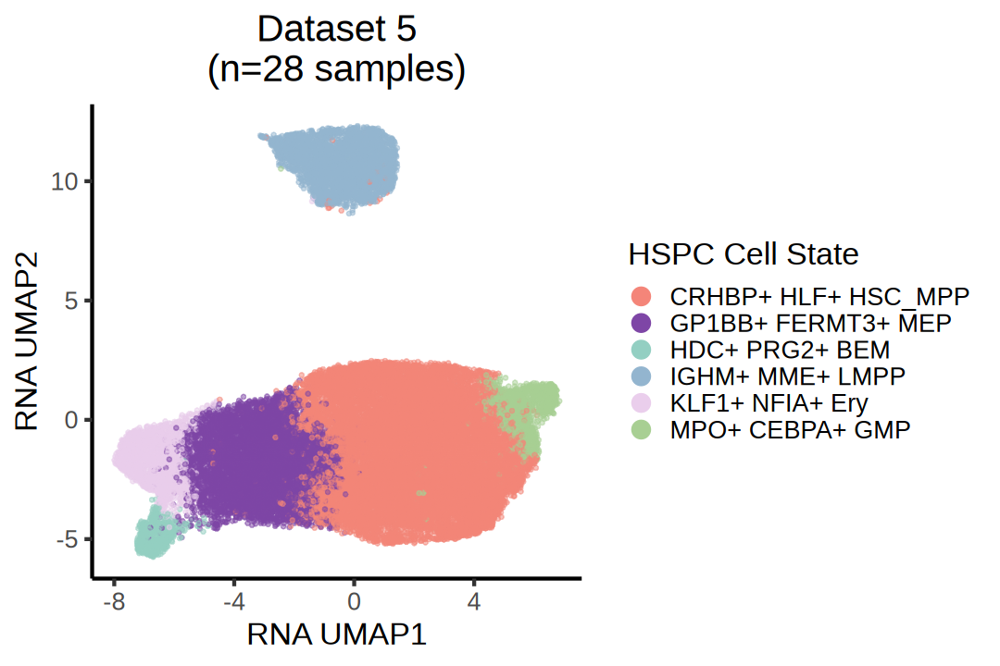

In [50]:
options(repr.plot.height=6,repr.plot.width=9)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=phenotype_str,x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_phenotype',file_extension),
           plot=g,units='in',height=6,width=9,dpi=300)
}

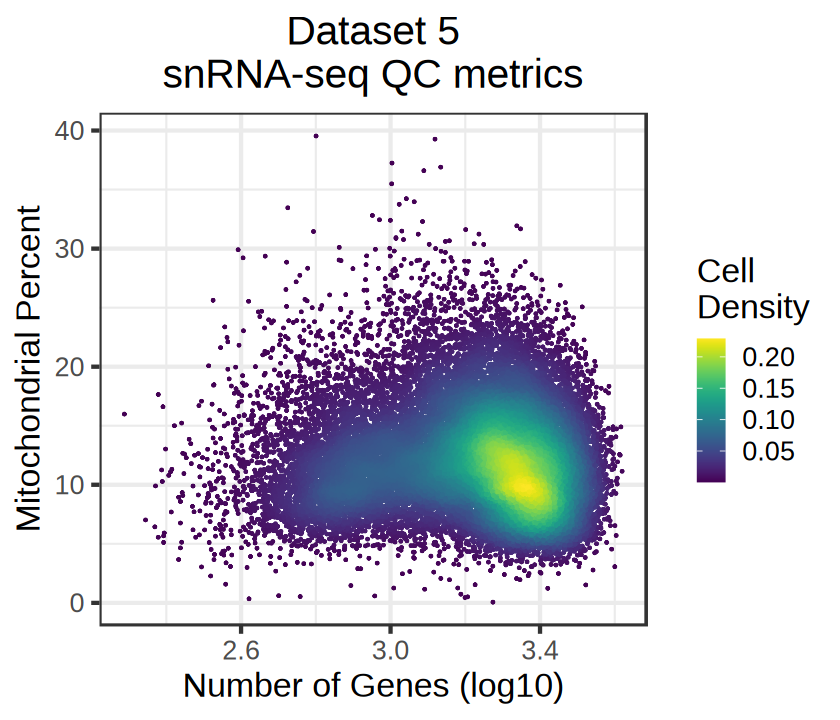

In [51]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nGene'=log10(meta$nGene),'MTperc'=meta$MTperc)
toPlot$density <- get_2D_density(toPlot$log10_nGene,toPlot$MTperc,n=1000)

g <- ggplot(toPlot,aes(x=log10_nGene,y=MTperc,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) +
            labs(x='Number of Genes (log10)',y='Mitochondrial Percent',color='Cell\nDensity',
                 title=paste(sep='\n',dataset_str_long,'snRNA-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_RNA_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

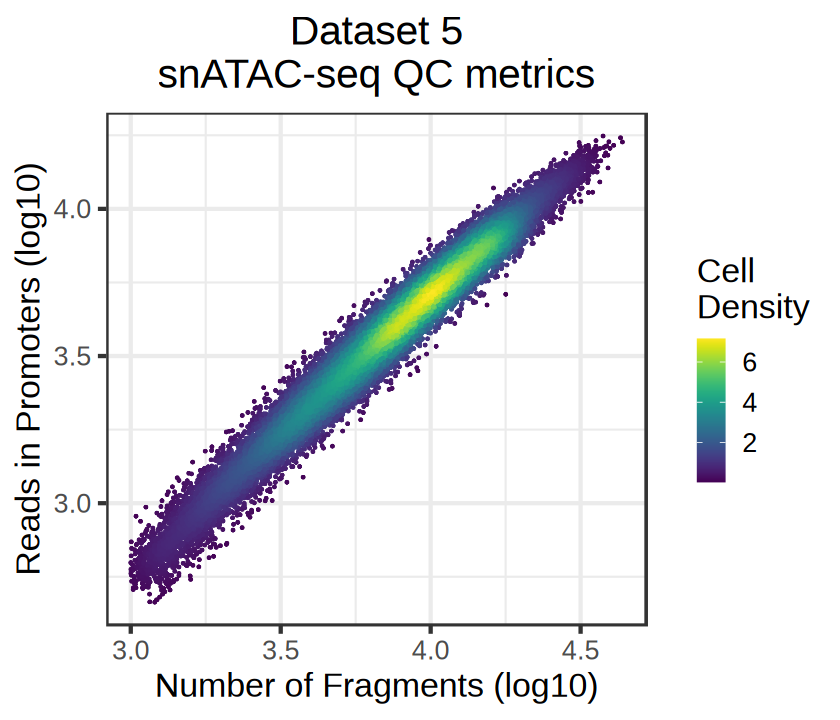

In [52]:
options(repr.plot.height=6,repr.plot.width=7)

toPlot <- data.frame('log10_nFrag'=log10(meta$nFrags),'log10_Prom'=log10(meta$ReadsInPromoter))
toPlot$density <- get_2D_density(toPlot$log10_nFrag,toPlot$log10_Prom,n=1000)

g <- ggplot(toPlot,aes(x=log10_nFrag,y=log10_Prom,color=density)) + 
            rasterise(geom_point(size=0.5),dpi=300) + 
            labs(x='Number of Fragments (log10)',y='Reads in Promoters (log10)',
                 color='Cell\nDensity',title=paste(sep='\n',dataset_str_long,'snATAC-seq QC metrics')) + 
            scale_color_viridis() + theme_bw(base_size = 20) + theme(plot.title = element_text(hjust = 0.5))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_ATAC_QC',file_extension),
           plot=g,units='in',height=6,width=7,dpi=300)
}

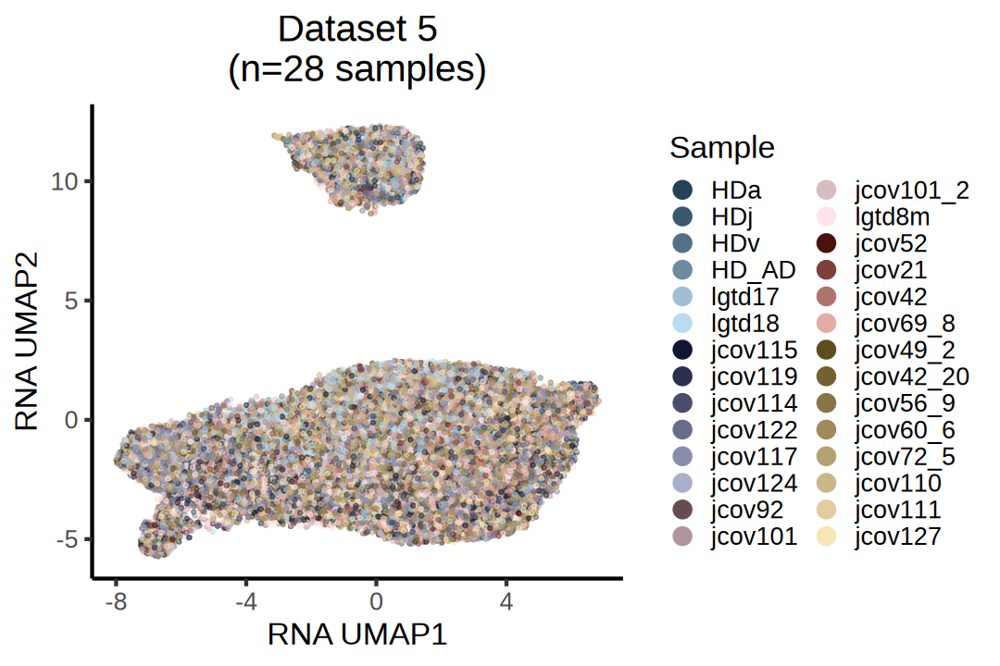

In [53]:
options(repr.plot.height=6,repr.plot.width=9)

meta$sample <- factor(meta$sample,levels=grep('HD|jcov|lgtd',names(colors_vec),value=TRUE))

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),],aes(x=RNA_UMAP1,y=RNA_UMAP2,color=sample)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample',x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_sample',file_extension),
           plot=g,units='in',height=6,width=9,dpi=300)
}

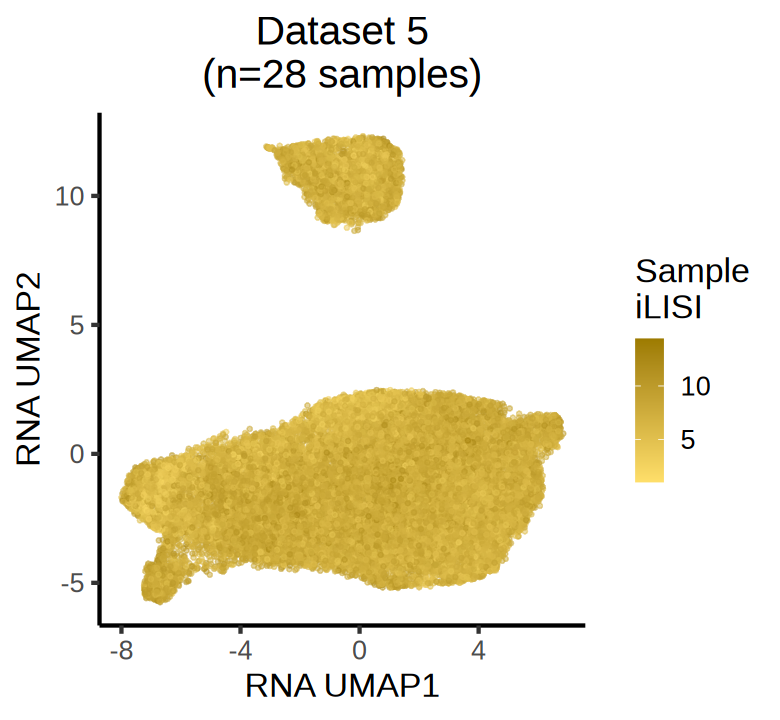

In [54]:
options(repr.plot.height=6,repr.plot.width=6.5)

set.seed(0)
g <- ggplot(meta[sample(nrow(meta),nrow(meta)),], aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_sample)) +
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=iLISI_low_color,high=iLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color='Sample\niLISI',x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiSample',file_extension),
           plot=g,units='in',height=6,width=6.5,dpi=300)
}

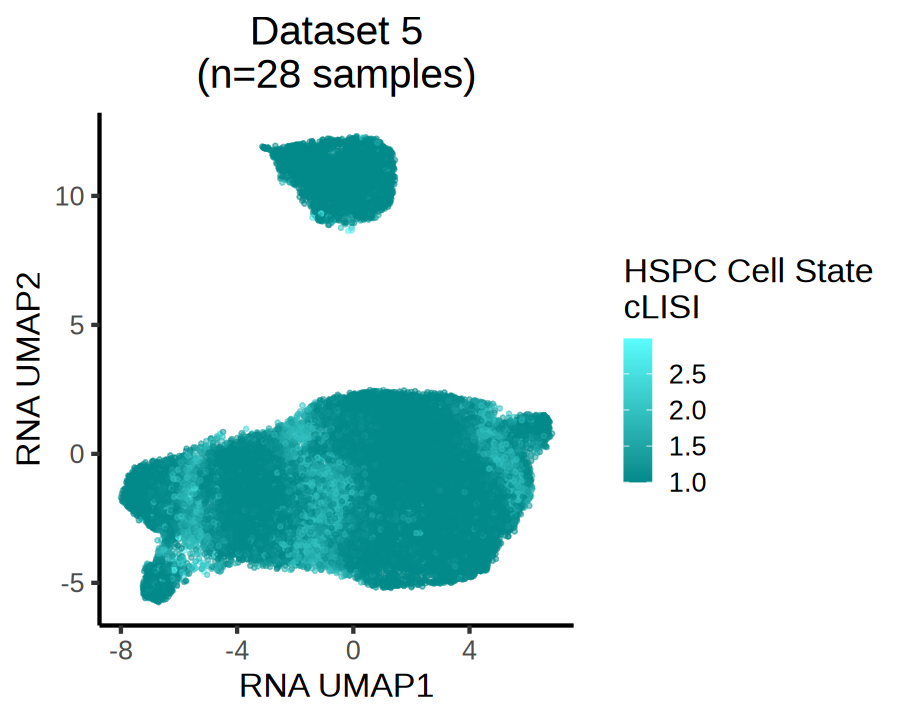

In [55]:
options(repr.plot.height=6,repr.plot.width=7.5)

g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=lisi_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_gradient(low=cLISI_low_color,high=cLISI_high_color,limits=c(1,NA)) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=paste(sep='\n',phenotype_str,'cLISI'),x='RNA UMAP1',y='RNA UMAP2')
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_lisiPhenotype',file_extension),
           plot=g,units='in',height=6,width=7.5,dpi=300)
}

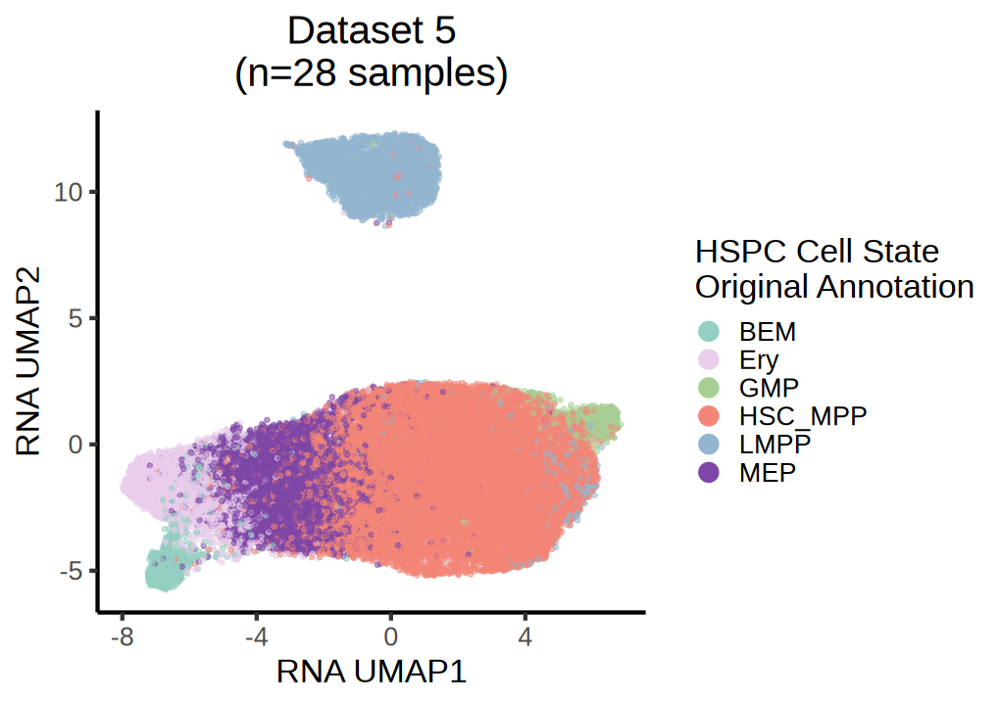

In [56]:
options(repr.plot.height=6,repr.plot.width=8.5)
g <- ggplot(meta,aes(x=RNA_UMAP1,y=RNA_UMAP2,color=ori_phenotype)) + 
        rasterise(geom_point(size=1,alpha=0.5),dpi=300) +
        theme_classic(base_size=20) + theme(plot.title = element_text(hjust = 0.5)) + 
        scale_color_manual(values=colors_vec) +
        ggtitle(paste(sep='\n',dataset_str_long,sample_str)) + 
        labs(color=sub(' - ','\n',ori_phenotype_str),x='RNA UMAP1',y='RNA UMAP2') +
        guides(colour = guide_legend(override.aes = list(size=5,alpha=1)))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_oriPheno',file_extension),
           plot=g,units='in',height=6,width=8.5,dpi=300)
}

In [57]:
chosenGenes <- c("CRHBP","HLF","FOXO1","AVP",
                 "IGHM","MME","DNTT","IRF9","AFF3",
                 "GP1BB","FERMT3","PLEK","MED12L",
                 "KLF1","NFIA","ACSM3","APOC1",
                 "MPO","CEBPA","IGLL1","CSF3R",
                 "HDC","PRG2","LMO4")
if(!all(chosenGenes %in% rownames(gxCT_norm))) stop('missing genes')
if(any(duplicated(chosenGenes))) stop('duplciated genes')

phenotype_order <- c('HSC_MPP','LMPP','MEP','Ery','GMP','BEM')
if(!all(phenotype_order %in% colnames(gxCT_norm))) stop('missing phenotypes')

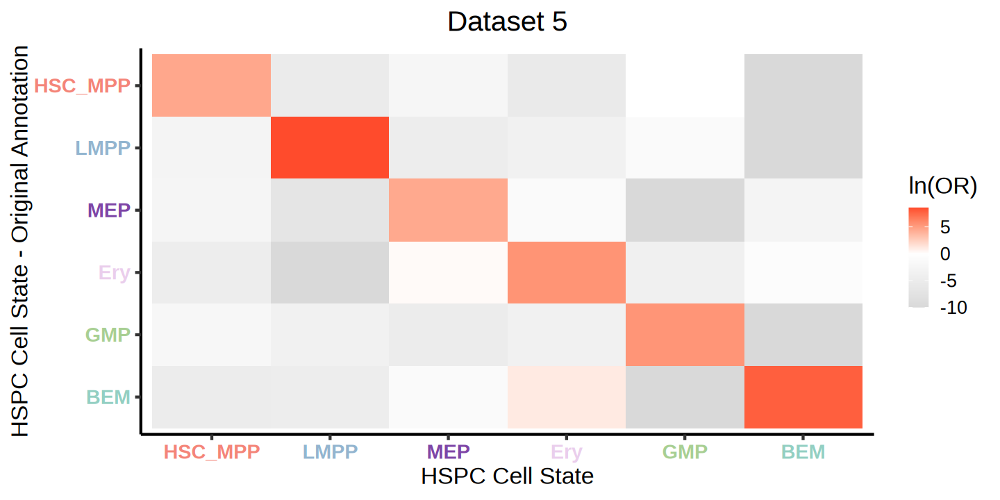

In [58]:
fisher_df <- calc_OR(meta, 'phenotype_abbr', 'ori_phenotype_abbr')

g <- plot_OR(fisher_df, 'phenotype_abbr', 'ori_phenotype_abbr',
             phenotype_str, ori_phenotype_str,
             phenotype_order, phenotype_order,
             clustColors=colors_vec)
g <- g + ggtitle(dataset_str_long) + theme(plot.title = element_text(hjust = 0.5)) 

options(repr.plot.height=6,repr.plot.width=12)
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_oriPhenolnOR',file_extension),
           plot=g,units='in',height=6,width=12,dpi=300)
}

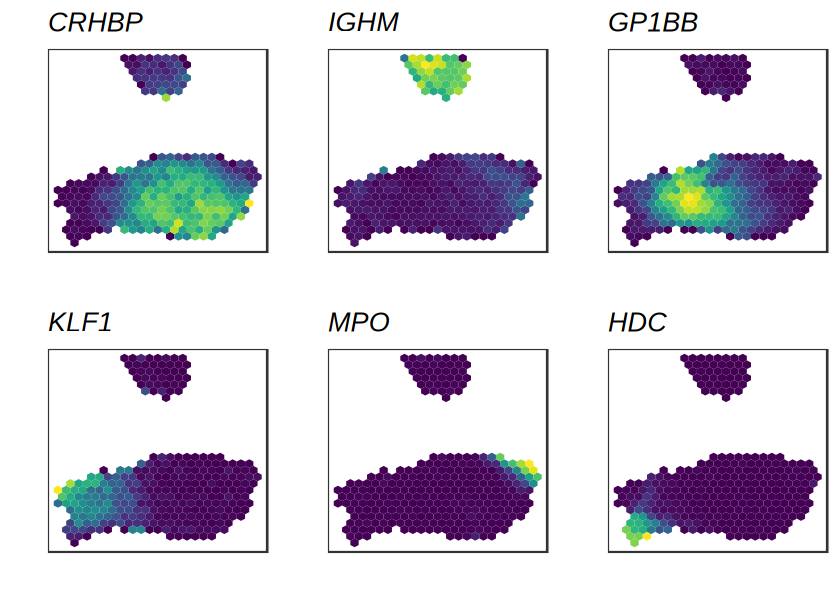

In [59]:
genes_forUMAPs <- c('CRHBP','IGHM','GP1BB','KLF1','MPO','HDC')
if(!all(genes_forUMAPs %in% chosenGenes)) stop('Genes for UMAP not in chosen genes')

options(repr.plot.height=5,repr.plot.width=7)
g <- plot_markerPeaks_norm_hex_v2(meta, gxc_norm[,rownames(meta)],'RNA_UMAP1','RNA_UMAP2',
                                  plot_genes=genes_forUMAPs,plotCol=3,
                                  titleSize=16,hex_bins=24,cutCap=0)
grid.draw(g)

if(!is.na(save_dir)) ggsave(file=paste(sep='',save_dir,dataset_str,'_UMAP_RNA_color_markerGeneExp',file_extension),
                            plot=g,units='in',height=5,width=7,dpi=300)

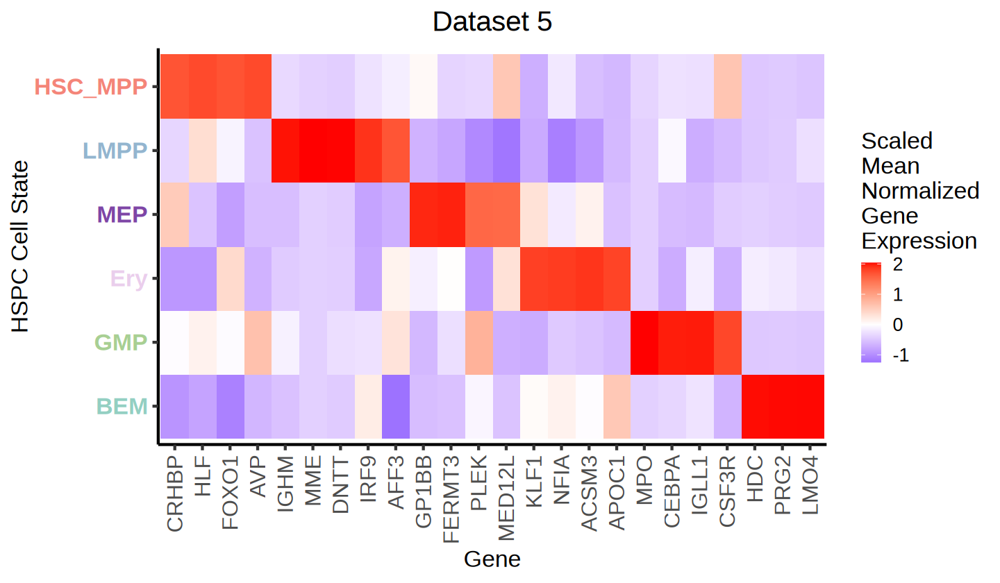

In [60]:
options(repr.plot.height=7,repr.plot.width=12)
g <- pseudobulk_scaled_heatmap(scaleGene_forHeatmap(chosenGenes,phenotype_order,gxCT_norm),
                               'Gene',phenotype_str,
                               'Scaled\nMean\nNormalized\nGene\nExpression',
                               plotTit=dataset_str_long,
                               clustColors=colors_vec)
g <- g + theme(axis.text.x = element_text(size=19))
print(g)

if(!is.na(save_dir)){
    ggsave(file=paste(sep='',save_dir,dataset_str,'_heatmap_markerGeneExp',file_extension),
           plot=g,units='in',height=7,width=12,dpi=300)
}

## Session Info

In [61]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /PHShome/kew47/miniconda3/envs/integrateATAC/lib/libopenblasp-r0.3.27.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] repr_1.1.7         gridExtra_2.3      patchwork_1.2.0    RColorBrewer_1.1-3
 [5] scales_1.3.0       viridis_0.6.5      viridisLite_0.4.2  ggrepel_0.9.5     
 [9] ggrastr_1.0.2      tidyr_1.3